In [3]:
pip install pymysql

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install scikit-learn

In [6]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install ta

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29421 sha256=dc4fa2a68180669f5872c8ff52fd6b977ae2c2e4a04f5e568f13756a8f21e9d2
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\5f\67\4f\8a9f252836e053e532c6587a3230bc72a4deb16b03a829610b
Successfully built ta
Note: you may need to restart the kernel to use updated packages.


  DEPRECATION: Building 'ta' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'ta'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [1]:
import platform
print(platform.python_version())
print(platform.architecture())


3.10.8
('64bit', 'WindowsPE')


In [2]:
import torch
print(torch.__version__)          # ควรแสดง 2.2.2
print(torch.cuda.is_available())  # ควรแสดง False


2.2.2+cpu
False


In [8]:
import pymysql
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt

Step 1: Load Data from Database

In [9]:
# เชื่อมต่อฐานข้อมูล
conn = pymysql.connect(
    host="ideatrade.serveftp.net",
    port=51410,
    user="Kanokwan@Namfon",
    password="lTGnGcygfnRqU_ps",
    database="db_ideatrade"
)

# ดึงข้อมูลหุ้น
query = """
SELECT Symbol, DateTime, Open, High, Low, Close, Volume
FROM stock_hloc
WHERE Symbol IN ('DELTA', 'EGCO', 'TOP', 'PTT', 'CPF') 
  AND TimeFrame = '1D'
  AND DateTime BETWEEN '2021-01-01' AND '2024-12-31'
ORDER BY DateTime ASC
"""

df = pd.read_sql(query, conn)
df['DateTime'] = pd.to_datetime(df['DateTime'])
conn.close()

print("Data shape:", df.shape)
print("Number of rows:", len(df))  # หรือ df.shape[0]

print(df.head(20))

print("\nNumber of rows per Symbol:")
print(df['Symbol'].value_counts())




C:\Users\User\AppData\Local\Temp\ipykernel_6976\3062637985.py:20: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn)


Data shape: (3025, 7)
Number of rows: 3025
   Symbol   DateTime    Open    High     Low   Close    Volume
0     CPF 2021-10-15   25.75   26.00   25.50   25.75  33250100
1   DELTA 2021-10-15  440.00  458.00  440.00  452.00   1595700
2    EGCO 2021-10-15  180.50  180.50  177.50  178.50   1433200
3     PTT 2021-10-15   39.75   40.00   39.00   39.25  51076700
4     TOP 2021-10-15   58.00   58.00   57.00   57.50  18942100
5     CPF 2021-10-18   25.75   26.00   25.25   25.50  37931900
6   DELTA 2021-10-18  462.00  490.00  448.00  454.00   4545100
7    EGCO 2021-10-18  179.00  181.50  179.00  180.50   1520100
8     PTT 2021-10-18   39.50   40.00   39.50   40.00  39184000
9     TOP 2021-10-18   57.50   57.75   57.25   57.75  10078700
10    CPF 2021-10-19   25.75   25.75   25.50   25.75  11784800
11  DELTA 2021-10-19  460.00  468.00  452.00  452.00   1664600
12   EGCO 2021-10-19  181.00  181.00  177.50  178.00   1962000
13    PTT 2021-10-19   40.00   40.25   39.25   39.50  54502400
14    TOP 20

In [10]:
import pymysql
import pandas as pd

# เชื่อมต่อฐานข้อมูล
conn = pymysql.connect(
    host="ideatrade.serveftp.net",
    port=51410,
    user="Kanokwan@Namfon",
    password="lTGnGcygfnRqU_ps",
    database="db_ideatrade"
)

# ดึงข้อมูลจากตาราง tickmatchs
query_tickmatchs = """
SELECT Symbol, Time, Last, Vol, Type, DtMinOfRec, CodeOfTime, CountOfTime, SeqOfDate, updated_at
FROM stocksm_tickmatchs
WHERE Symbol IN ('DELTA', 'EGCO', 'TOP', 'PTT', 'CPF') 
  AND DtMinOfRec BETWEEN '2022-01-01' AND '2024-12-31'
ORDER BY DtMinOfRec ASC
"""
df_tickmatchs = pd.read_sql(query_tickmatchs, conn)

# ปิดการเชื่อมต่อหลังจากดึงข้อมูลแล้ว
conn.close()

# แปลงคอลัมน์วันที่เป็น datetime
df_tickmatchs['DtMinOfRec'] = pd.to_datetime(df_tickmatchs['DtMinOfRec'])

# แสดงข้อมูล
print("Tickmatchs Data shape:", df_tickmatchs.shape)
print("\nTickmatchs Data Head:")
print(df_tickmatchs.head(20))


C:\Users\User\AppData\Local\Temp\ipykernel_6976\2526545453.py:21: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_tickmatchs = pd.read_sql(query_tickmatchs, conn)


Tickmatchs Data shape: (11922325, 10)

Tickmatchs Data Head:
   Symbol                  Time   Last     Vol  Type          DtMinOfRec  \
0     CPF  2022.01.04 10:00.572  26.25   10000   BUY 2022-01-04 10:00:00   
1     CPF  2022.01.04 10:00.090  26.25     300   BUY 2022-01-04 10:00:00   
2     CPF  2022.01.04 10:00.104  26.25     200   BUY 2022-01-04 10:00:00   
3     CPF  2022.01.04 10:00.120  26.25     300   BUY 2022-01-04 10:00:00   
4     CPF  2022.01.04 10:00.179  26.25     100   BUY 2022-01-04 10:00:00   
5     CPF  2022.01.04 10:00.301  26.25    1000   BUY 2022-01-04 10:00:00   
6     CPF  2022.01.04 10:00.898  26.25   20000   BUY 2022-01-04 10:00:00   
7     CPF  2022.01.04 10:00.273  26.25     100   BUY 2022-01-04 10:00:00   
8     CPF  2022.01.04 10:00.397  26.00  100000  SELL 2022-01-04 10:00:00   
9     CPF  2022.01.04 10:00.016  26.25   50000   BUY 2022-01-04 10:00:00   
10    CPF  2022.01.04 10:00.316  26.25     100   BUY 2022-01-04 10:00:00   
11    CPF  2022.01.04 10:00

Step 2: Calculate 14 Technical Indicators (Manual Implementation)

In [13]:
def compute_indicators(df):
    df = df.sort_values(['Symbol', 'DateTime'])

    def rsi(series, period=14):
        delta = series.diff()
        gain = delta.where(delta > 0, 0.0)
        loss = -delta.where(delta < 0, 0.0)
        avg_gain = gain.rolling(window=period).mean()
        avg_loss = loss.rolling(window=period).mean().replace(0, 0.0001)
        rs = avg_gain / avg_loss
        return 100 - (100 / (1 + rs))

    def cci(df, period=20):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        ma = tp.rolling(period).mean()
        md = tp.rolling(period).apply(lambda x: abs(x - x.mean()).mean(), raw=True).replace(0, 0.0001)
        return (tp - ma) / (0.015 * md)

    def williams_r(df, period=14):
        high = df['High'].rolling(period).max()
        low = df['Low'].rolling(period).min()
        denom = (high - low).replace(0, 0.0001)
        return -100 * (high - df['Close']) / denom

    def trix(series, period=15):
        ema1 = series.ewm(span=period).mean()
        ema2 = ema1.ewm(span=period).mean()
        ema3 = ema2.ewm(span=period).mean()
        return ema3.pct_change() * 100

    def ppo(series, fast=12, slow=26):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean().replace(0, 0.0001)
        return (ema_fast - ema_slow) / ema_slow * 100

    def adx(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        plus_dm = high.diff()
        minus_dm = low.diff()
        plus_dm[plus_dm < 0] = 0
        minus_dm[minus_dm > 0] = 0
        tr1 = high - low
        tr2 = abs(high - close.shift())
        tr3 = abs(low - close.shift())
        tr = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)
        atr = tr.rolling(period).mean()
        plus_di = 100 * (plus_dm.rolling(period).mean() / atr).replace(0, 0.0001)
        minus_di = abs(100 * (minus_dm.rolling(period).mean() / atr)).replace(0, 0.0001)
        dx = (abs(plus_di - minus_di) / (plus_di + minus_di)).replace(0, 0.0001) * 100
        return dx.rolling(period).mean()

    def aroon(df, period=25):
        aroon_up = df['High'].rolling(window=period).apply(lambda x: float(x.argmax()) / period * 100, raw=True)
        aroon_down = df['Low'].rolling(window=period).apply(lambda x: float(x.argmin()) / period * 100, raw=True)
        return aroon_up, aroon_down

    def mfi(df, period=14):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        mf = tp * df['Volume']
        pos_mf = mf.where(tp > tp.shift(), 0.0)
        neg_mf = mf.where(tp < tp.shift(), 0.0)
        pos_sum = pos_mf.rolling(period).sum()
        neg_sum = neg_mf.rolling(period).sum().replace(0, 0.0001)
        mfr = pos_sum / neg_sum
        return 100 - (100 / (1 + mfr))

    def roc(series, period=12):
        return series.pct_change(periods=period) * 100

    def stochastic_rsi(series, period=14):
        rsi_series = rsi(series, period)
        min_val = rsi_series.rolling(period).min()
        max_val = rsi_series.rolling(period).max()
        return (rsi_series - min_val) / (max_val - min_val + 1e-6)

    def ema(series, period=14):
        return series.ewm(span=period).mean()

    def sma(series, period=14):
        return series.rolling(window=period).mean()

    def macd(series, fast=12, slow=26, signal=9):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean()
        macd_line = ema_fast - ema_slow
        signal_line = macd_line.ewm(span=signal).mean()
        return macd_line, signal_line

    def atr(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        tr = pd.concat([
            high - low,
            abs(high - close.shift()),
            abs(low - close.shift())
        ], axis=1).max(axis=1)
        return tr.rolling(period).mean()
    


    # คำนวณ indicators สำหรับแต่ละ symbol แยกกัน
    result_df = pd.DataFrame()

    for symbol in df['Symbol'].unique():
        symbol_df = df[df['Symbol'] == symbol].copy()

        symbol_df['RSI'] = rsi(symbol_df['Close'])
        symbol_df['CCI'] = cci(symbol_df)
        symbol_df['WR'] = williams_r(symbol_df)
        symbol_df['TRIX'] = trix(symbol_df['Close'])
        symbol_df['PPO'] = ppo(symbol_df['Close'])
        symbol_df['ADX'] = adx(symbol_df)
        symbol_df['AROON_UP'], symbol_df['AROON_DOWN'] = aroon(symbol_df)
        symbol_df['MFI'] = mfi(symbol_df)
        symbol_df['ROC'] = roc(symbol_df['Close'])
        symbol_df['STOCH_RSI'] = stochastic_rsi(symbol_df['Close'])
        symbol_df['EMA'] = ema(symbol_df['Close'])
        symbol_df['SMA'] = sma(symbol_df['Close'])
        symbol_df['MACD'], symbol_df['MACD_SIGNAL'] = macd(symbol_df['Close'])
        symbol_df['ATR'] = atr(symbol_df)

        result_df = pd.concat([result_df, symbol_df])

    # ลบแถวที่มีค่า NaN และ reset index
    result_df = result_df.dropna().reset_index(drop=True)
    return result_df


# คำนวณ technical indicators
df = compute_indicators(df)
print("\nData with indicators:")
print(df.head(5))


Data with indicators:
  Symbol   DateTime  Open   High   Low  Close    Volume        RSI  \
0    CPF 2021-11-24  24.9  25.25  24.9   24.9   9153200  46.428571   
1    CPF 2021-11-25  25.0  25.25  24.8   24.9  17579000  46.428571   
2    CPF 2021-11-26  24.9  24.90  24.6   24.6  26193100  38.235294   
3    CPF 2021-11-29  24.6  24.80  24.5   24.6  17630000  38.235294   
4    CPF 2021-11-30  24.5  24.70  23.8   23.8  54409800  27.083333   

          CCI          WR  ...  AROON_UP  AROON_DOWN        MFI       ROC  \
0  -40.707965  -53.846154  ...       0.0        60.0  62.735770 -0.400000   
1  -57.516340  -53.846154  ...       0.0        56.0  53.963650 -0.400000   
2 -238.532110 -100.000000  ...       0.0        52.0  45.868677 -1.204819   
3 -222.393426  -86.666667  ...       0.0        96.0  42.842989 -0.806452   
4 -337.325349 -100.000000  ...       0.0        96.0  37.567034 -5.742574   

   STOCH_RSI        EMA        SMA      MACD  MACD_SIGNAL       ATR  
0   0.880952  25.031294

In [ ]:
pip install tabulate


Note: you may need to restart the kernel to use updated packages.


In [14]:
from tabulate import tabulate
import pandas as pd

# ปรับ options ให้แสดงทุกคอลัมน์ใน Pandas
pd.set_option('display.max_columns', None)

# ปัดเศษค่าให้สวยงาม
df_display = df.head(10).copy().round(2)

# แสดงเป็นตารางสวยงามด้วย tabulate
print("\nData with All Indicators:")
print(tabulate(df_display, headers='keys', tablefmt='pretty', showindex=False))



Data with All Indicators:
+--------+---------------------+------+-------+------+-------+----------+-------+---------+--------+-------+-------+-------+----------+------------+-------+-------+-----------+-------+-------+-------+-------------+------+
| Symbol |      DateTime       | Open | High  | Low  | Close |  Volume  |  RSI  |   CCI   |   WR   | TRIX  |  PPO  |  ADX  | AROON_UP | AROON_DOWN |  MFI  |  ROC  | STOCH_RSI |  EMA  |  SMA  | MACD  | MACD_SIGNAL | ATR  |
+--------+---------------------+------+-------+------+-------+----------+-------+---------+--------+-------+-------+-------+----------+------------+-------+-------+-----------+-------+-------+-------+-------------+------+
|  CPF   | 2021-11-24 00:00:00 | 24.9 | 25.25 | 24.9 | 24.9  | 9153200  | 46.43 | -40.71  | -53.85 | -0.07 | -0.28 | 61.25 |   0.0    |    60.0    | 62.74 | -0.4  |   0.88    | 25.03 | 25.01 | -0.07 |    -0.07    | 0.34 |
|  CPF   | 2021-11-25 00:00:00 | 25.0 | 25.25 | 24.8 | 24.9  | 17579000 | 46.43 | -57

Step 3: Label with N-Period Min-Max (NPMM)

In [15]:
def npmm_label(df, window):
    df_labeled = df.copy()
    
    # สร้างคอลัมน์ Label และกำหนด dtype เป็น object ทันที
    df_labeled['Label'] = pd.Series(index=df_labeled.index, dtype='object')

    for symbol in df_labeled['Symbol'].unique():
        symbol_df = df_labeled[df_labeled['Symbol'] == symbol].copy()
        symbol_df = symbol_df.sort_values('DateTime').reset_index(drop=True)

        symbol_df['Label'] = pd.Series(['Hold'] * len(symbol_df), dtype='object')

        for i in range(len(symbol_df) - window):
            close_now = symbol_df.iloc[i]['Close']
            future_window = symbol_df.iloc[i+1:i+1+window]['Close']

            if close_now >= future_window.max() * 0.99:  # เดิม 0.985 => ผ่อน Sell ให้ง่ายขึ้น
                symbol_df.loc[i, 'Label'] = 'Sell'
            elif close_now <= future_window.min() * 1.01:  # เดิม 1.015 => ผ่อน Buy ให้ง่ายขึ้น
                symbol_df.loc[i, 'Label'] = 'Buy'
            # ไม่ต้อง else เพราะ 'Hold' ถูกตั้งไว้

        # กำหนด Label กลับเข้า df_labeled อย่างปลอดภัย
        df_labeled.loc[df_labeled['Symbol'] == symbol, 'Label'] = symbol_df['Label'].values

    # ลบแถวที่ Label ยังเป็น NaN
    df_labeled = df_labeled.dropna(subset=['Label']).reset_index(drop=True)

    # ตรวจสอบผลลัพธ์
    unique_labels = df_labeled['Label'].unique().tolist()
    print(f"\nLabels for window {window}: {unique_labels}")
    print(f"Label distribution for {window}-day window:")
    print(df_labeled['Label'].value_counts())

    # ปริ้น label list แบบ array
    print("\nLabel sequence preview:")
    labels_array = df_labeled['Label'].values
    for i in range(0, len(labels_array), 20):
        print(' '.join(labels_array[i:i+20]))

    return df_labeled

# เรียกใช้งาน
df_15 = npmm_label(df, window=15)



Labels for window 15: ['Sell', 'Buy', 'Hold']
Label distribution for 15-day window:
Label
Hold    1292
Sell     887
Buy      711
Name: count, dtype: int64

Label sequence preview:
Sell Sell Sell Sell Buy Hold Buy Hold Hold Hold Buy Buy Buy Buy Hold Hold Hold Buy Buy Buy
Buy Buy Buy Buy Buy Sell Hold Hold Sell Sell Sell Sell Sell Sell Sell Sell Buy Buy Sell Sell
Sell Sell Buy Buy Buy Hold Buy Buy Buy Hold Hold Hold Hold Hold Hold Hold Hold Sell Sell Sell
Sell Hold Sell Sell Hold Hold Hold Buy Buy Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell
Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell Hold Buy Buy Buy Buy Hold Hold Buy Buy Buy
Buy Buy Buy Buy Buy Hold Buy Hold Sell Hold Sell Hold Sell Sell Sell Sell Sell Sell Sell Sell
Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell Hold Hold Hold Hold Hold Sell Sell Sell Sell Sell
Sell Sell Sell Sell Sell Hold Sell Sell Hold Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell Sell
Sell Sell Hold Buy Buy Hold Hold Hold Hold Hold Sell Sel

In [17]:
pip install plotly


   ---------------------------------------- 16.1/16.1 MB 2.5 MB/s eta 0:00:00

Note: you may need to restart the kernel to use updated packages.


In [275]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder

# สร้าง Label Buy / Hold / Sell
def npmm_label(df, window):
    df_labeled = df.copy()
    df_labeled['Label'] = pd.Series(index=df_labeled.index, dtype='object')

    for symbol in df_labeled['Symbol'].unique():
        symbol_df = df_labeled[df_labeled['Symbol'] == symbol].copy()
        symbol_df = symbol_df.sort_values('DateTime').reset_index(drop=True)
        symbol_df['Label'] = pd.Series(['Hold'] * len(symbol_df), dtype='object')

        for i in range(len(symbol_df) - window):
            close_now = symbol_df.iloc[i]['Close']
            future_window = symbol_df.iloc[i+1:i+1+window]['Close']

            if close_now >= future_window.max() * 0.99:
                symbol_df.loc[i, 'Label'] = 'Sell'
            elif close_now <= future_window.min() * 1.01:
                symbol_df.loc[i, 'Label'] = 'Buy'

        df_labeled.loc[df_labeled['Symbol'] == symbol, 'Label'] = symbol_df['Label'].values

    df_labeled = df_labeled.dropna(subset=['Label']).reset_index(drop=True)
    return df_labeled

def plot_price_with_labels_plotly(df_labeled, symbol, save_path=None):
    df_symbol = df_labeled[df_labeled['Symbol'] == symbol].copy()
    df_symbol = df_symbol.sort_values('DateTime')

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=df_symbol['DateTime'],
        y=df_symbol['Close'],
        mode='lines',
        name='Close Price',
        line=dict(color='gray', width=1)
    ))

    buy = df_symbol[df_symbol['Label'] == 'Buy']
    fig.add_trace(go.Scatter(
        x=buy['DateTime'],
        y=buy['Close'],
        mode='markers',
        name='Buy',
        marker=dict(color='green', size=8, symbol='triangle-up')
    ))

    sell = df_symbol[df_symbol['Label'] == 'Sell']
    fig.add_trace(go.Scatter(
        x=sell['DateTime'],
        y=sell['Close'],
        mode='markers',
        name='Sell',
        marker=dict(color='red', size=8, symbol='triangle-down')
    ))

    hold = df_symbol[df_symbol['Label'] == 'Hold']
    fig.add_trace(go.Scatter(
        x=hold['DateTime'],
        y=hold['Close'],
        mode='markers',
        name='Hold',
        marker=dict(color='blue', size=4, opacity=0.3)
    ))

    fig.update_layout(
        title=f"Price with Buy/Hold/Sell Labels for {symbol}",
        xaxis_title="Date",
        yaxis_title="Close Price",
        template="plotly_white",
        hovermode="x unified",
        height=600,
        legend=dict(x=0, y=1),
        xaxis_rangeslider_visible=True
    )

    # ✅ ถ้า save_path ถูกระบุ ให้เซฟเป็นเว็บไฟล์
    if save_path:
        fig.write_html(save_path)
        print(f"Saved interactive chart to: {save_path}")
    else:
        fig.show()
    df_15 = npmm_label(df, window=15)

for symbol in df_15['Symbol'].unique():
    filename = f"{symbol}_price_with_labels.html"
    plot_price_with_labels_plotly(df_15, symbol, save_path=filename)
    


Saved interactive chart to: CPF_price_with_labels.html
Saved interactive chart to: DELTA_price_with_labels.html
Saved interactive chart to: EGCO_price_with_labels.html
Saved interactive chart to: PTT_price_with_labels.html
Saved interactive chart to: TOP_price_with_labels.html


In [16]:
# แปลงวันที่ให้ตรงกัน
df_tickmatchs['Date'] = df_tickmatchs['DtMinOfRec'].dt.date
df['Date'] = df['DateTime'].dt.date

# ตรวจสอบและปรับ Symbol ให้ตรงกัน
df_tickmatchs['Symbol'] = df_tickmatchs['Symbol'].str.upper()
df['Symbol'] = df['Symbol'].str.upper()

# สร้างฟีเจอร์จาก tick
df_tick_features = df_tickmatchs.groupby(['Symbol', 'Date']).apply(lambda x: pd.Series({
    'Buy_vol': x.loc[x['Type'].str.upper() == 'BUY', 'Vol'].sum(),
    'Sell_vol': x.loc[x['Type'].str.upper() == 'SELL', 'Vol'].sum(),
    'Buy_count': (x['Type'].str.upper() == 'BUY').sum(),
    'Sell_count': (x['Type'].str.upper() == 'SELL').sum(),
    'Trade_count': len(x)
})).reset_index()

# merge เข้ากับ OHLCV
df_merged = pd.merge(df, df_tick_features, how='left', on=['Symbol', 'Date'])

# เติม NaN ด้วย 0
for col in ['Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count']:
    df_merged[col] = df_merged[col].fillna(0)

print(df_merged[['Symbol', 'Date', 'Close', 'Buy_vol', 'Sell_vol', 'Trade_count']].head(10))


  Symbol        Date  Close  Buy_vol  Sell_vol  Trade_count
0    CPF  2021-11-24   24.9      0.0       0.0          0.0
1    CPF  2021-11-25   24.9      0.0       0.0          0.0
2    CPF  2021-11-26   24.6      0.0       0.0          0.0
3    CPF  2021-11-29   24.6      0.0       0.0          0.0
4    CPF  2021-11-30   23.8      0.0       0.0          0.0
5    CPF  2021-12-01   23.9      0.0       0.0          0.0
6    CPF  2021-12-02   23.7      0.0       0.0          0.0
7    CPF  2021-12-03   24.0      0.0       0.0          0.0
8    CPF  2021-12-07   24.1      0.0       0.0          0.0
9    CPF  2021-12-08   24.0      0.0       0.0          0.0


C:\Users\User\AppData\Local\Temp\ipykernel_6976\504335532.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_tick_features = df_tickmatchs.groupby(['Symbol', 'Date']).apply(lambda x: pd.Series({


In [17]:
# ตรวจสอบว่า 'Date' เป็น datetime (ไม่ใช่ date object ธรรมดา)
df_merged['Date'] = pd.to_datetime(df_merged['Date'])

# กรองเฉพาะปี 2022
df_2022 = df_merged[df_merged['Date'].dt.year == 2022]

# แสดงตัวอย่างข้อมูล
print(df_2022[['Symbol', 'Date', 'Close', 'Buy_vol', 'Sell_vol', 'Trade_count']].head(20))


   Symbol       Date  Close     Buy_vol    Sell_vol  Trade_count
25    CPF 2022-01-04  27.00  90800500.0  40833000.0      14339.0
26    CPF 2022-01-05  26.50  16511000.0  26138800.0       6265.0
27    CPF 2022-01-06  26.75  60206900.0  33882400.0       7359.0
28    CPF 2022-01-07  27.00   7456900.0  12709500.0       2423.0
29    CPF 2022-01-10  27.00  29670800.0  18648300.0       4434.0
30    CPF 2022-01-11  27.25  24707700.0  24324000.0       4685.0
31    CPF 2022-01-12  26.75  18597800.0  25055200.0       4385.0
32    CPF 2022-01-13  26.50         0.0         0.0          0.0
33    CPF 2022-01-14  26.50         0.0         0.0          0.0
34    CPF 2022-01-17  26.50         0.0         0.0          0.0
35    CPF 2022-01-18  25.75         0.0         0.0          0.0
36    CPF 2022-01-19  25.50         0.0         0.0          0.0
37    CPF 2022-01-20  25.25         0.0         0.0          0.0
38    CPF 2022-01-21  25.75         0.0         0.0          0.0
39    CPF 2022-01-24  26.

In [18]:
# ตรวจสอบและสร้าง 'Date' ถ้าไม่มีใน df_15
if 'Date' not in df_15.columns:
    if 'DateTime' in df_15.columns:
        df_15['Date'] = pd.to_datetime(df_15['DateTime']).dt.date

# แปลงเป็น datetime64[ns] ให้ตรงกับ df_tick_features
df_15['Date'] = pd.to_datetime(df_15['Date'])
df_tick_features['Date'] = pd.to_datetime(df_tick_features['Date'])

# ตรวจสอบ Symbol
df_15['Symbol'] = df_15['Symbol'].str.upper()
df_tick_features['Symbol'] = df_tick_features['Symbol'].str.upper()

# merge
df_15 = pd.merge(df_15, df_tick_features, how='left', on=['Symbol', 'Date'])

# เติม NaN
for col in ['Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count']:
    df_15[col] = df_15[col].fillna(0)


In [19]:
print(df_15.columns)
print(df_tick_features.columns)
print(df_merged.columns)


Index(['Symbol', 'DateTime', 'Open', 'High', 'Low', 'Close', 'Volume', 'RSI',
       'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 'AROON_UP', 'AROON_DOWN', 'MFI',
       'ROC', 'STOCH_RSI', 'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR', 'Label',
       'Date', 'Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count',
       'Trade_count'],
      dtype='object')
Index(['Symbol', 'Date', 'Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count',
       'Trade_count'],
      dtype='object')
Index(['Symbol', 'DateTime', 'Open', 'High', 'Low', 'Close', 'Volume', 'RSI',
       'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 'AROON_UP', 'AROON_DOWN', 'MFI',
       'ROC', 'STOCH_RSI', 'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR', 'Date',
       'Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count'],
      dtype='object')


Step 4: Create Sliding Window Sequences

In [32]:
import numpy as np
import pandas as pd

# ฟีเจอร์ indicators + derived + buy/sell
INDICATOR_FEATURES = [
   'Close', 'RSI', 'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 
    'AROON_UP', 'AROON_DOWN', 'MFI', 'ROC', 'STOCH_RSI', 
    'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR',
    'High_Low','Close_Open', 'Price_change_pct',
    'Close_MA5', 'Close_STD5', 'Volume_MA5','Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count',
    'Buy_Sell_Ratio', 'Buy_Trade_Ratio', 'Buy_Volume_Spike', 'Buy_Dominance',
    "Long_Upper_Shadow", "Bearish_Engulfing", 
    "Closed_Near_Low"
]


# ฟังก์ชันเพิ่มฟีเจอร์จาก OHLCV + tickmatchs
def add_derived_features(df):
    df['High_Low'] = df['High'] - df['Low']  # ช่วงราคาในวัน
    df['Close_Open'] = df['Close'] - df['Open']  # การเคลื่อนไหวของราคา
    df['Price_change_pct'] = (df['Close'] - df['Open']) / df['Open'] * 100  # เปอร์เซ็นต์เปลี่ยนแปลงราคา

    df['Close_MA5'] = df['Close'].rolling(window=5).mean()  # เฉลี่ยปิด 5 วัน
    df['Close_STD5'] = df['Close'].rolling(window=5).std()  # ความผันผวน 5 วัน
    df['Volume_MA5'] = df['Volume'].rolling(window=5).mean()  # เฉลี่ยวอลุ่ม 5 วัน

    # buy (จาก tickmatchs)
    df['Buy_Sell_Ratio'] = df['Buy_vol'] / (df['Sell_vol'] + 1)  # สัดส่วนซื้อ/ขาย
    df['Buy_Trade_Ratio'] = df['Buy_count'] / (df['Trade_count'] + 1)  # สัดส่วนคำสั่งซื้อ
    df['Buy_Volume_Spike'] = df['Buy_vol'] / (df['Buy_vol'].rolling(5).mean() + 1e-6)  # วอลุ่มซื้อพุ่ง
    df['Buy_Dominance'] = (df['Buy_vol'] - df['Sell_vol']) / (df['Buy_vol'] + df['Sell_vol'] + 1)  # ฝั่งซื้อเด่น

    # # sell
    df["Upper_Shadow"] = df["High"] - df[["Open", "Close"]].max(axis=1)  # ไส้เทียนบน
    df["Long_Upper_Shadow"] = (df["Upper_Shadow"] > (df["High"] - df["Low"]) * 0.6).astype(int)  # ไส้ยาว

    df["Prev_Close"] = df["Close"].shift(1)  # ปิดวันก่อน
    df["Prev_Open"] = df["Open"].shift(1)  # เปิดวันก่อน
    df["Bearish_Engulfing"] = (
        (df["Prev_Close"] > df["Prev_Open"]) &
        (df["Open"] > df["Close"]) &
        (df["Open"] > df["Prev_Close"]) &
        (df["Close"] < df["Prev_Open"])
    ).astype(int)  # engulfing แดง

    df["Close_to_Low_Pct"] = (df["Close"] - df["Low"]) / (df["High"] - df["Low"] + 1e-6)  # ปิดใกล้ low
    df["Closed_Near_Low"] = (df["Close_to_Low_Pct"] < 0.2).astype(int)  # ปิดใกล้ low มาก


    
    return df

# ฟังก์ชันสร้าง X, y จาก window ขนาด 15 วัน
def create_sequences(df_labeled, window_size=15):
    X, y = [], []

    for symbol in df_labeled['Symbol'].unique():
        symbol_df = df_labeled[df_labeled['Symbol'] == symbol].copy()
        symbol_df = symbol_df.sort_values('DateTime').reset_index(drop=True)

        # สร้างฟีเจอร์ก่อน
        symbol_df = add_derived_features(symbol_df)

        # ดรอปแถวที่มี NaN
        symbol_df = symbol_df.dropna(subset=INDICATOR_FEATURES)

        for i in range(len(symbol_df) - window_size):
            window = symbol_df.iloc[i:i+window_size]
            label_index = i + window_size

            if label_index < len(symbol_df):
                X.append(window[INDICATOR_FEATURES].values)
                y.append(symbol_df.iloc[label_index]['Label'])

    return np.array(X), np.array(y)

# สร้าง X15, y15
X15, y15 = create_sequences(df_15, window_size=5)

print("Shape of X15:", X15.shape)
print("Label distribution for y15:", y15)


Shape of X15: (2845, 5, 35)
Label distribution for y15: ['Hold' 'Buy' 'Buy' ... 'Hold' 'Hold' 'Hold']


In [33]:
from collections import Counter

# แสดงจำนวนของแต่ละคลาส
label_counts = Counter(y15)
print("Class distribution in y15:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

Class distribution in y15:
Hold: 1274
Buy: 699
Sell: 872


Step 5: Build Transformer Model (PyTorch)


In [34]:
import torch
import torch.nn as nn
from imblearn.over_sampling import SMOTE
import numpy as np
import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

class TransformerSignalPredictor(nn.Module):
    def __init__(self, input_dim, model_dim, num_heads, num_layers, num_classes=3):
        super().__init__()
        self.embedding = nn.Linear(input_dim, model_dim)
        self.positional_encoding = nn.Parameter(torch.zeros(1, 100, model_dim))
        
        # เพิ่ม batch normalization
        self.input_norm = nn.BatchNorm1d(input_dim)
        
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=model_dim, 
            nhead=num_heads, 
            dim_feedforward=model_dim*4,
            dropout=0.1,
            activation='gelu'
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        
        # สร้าง classifier
        self.classifier = nn.Sequential(
            nn.Linear(model_dim, model_dim),
            nn.LayerNorm(model_dim),
            nn.GELU(),
            nn.Dropout(0.2),
            nn.Linear(model_dim, num_classes)
        )
        
        # Attention pooling
        self.attention_weights = nn.Linear(model_dim, 1)

    def forward(self, x):
        batch_size, seq_len, feature_dim = x.size()
        
        # Apply batch normalization
        x_reshaped = x.reshape(-1, feature_dim)
        x_normed = self.input_norm(x_reshaped)
        x = x_normed.reshape(batch_size, seq_len, feature_dim)
        
        x = self.embedding(x)
        pos_enc = self.positional_encoding[:, :seq_len, :]
        x = x + pos_enc
        
        x = x.permute(1, 0, 2)  # (S, B, D) for transformer
        output = self.transformer(x)  # (S, B, D)
        output = output.permute(1, 0, 2)  # (B, S, D)
        
        # Attention pooling
        attn_weights = self.attention_weights(output).squeeze(-1)  # (B, S)
        attn_weights = torch.softmax(attn_weights, dim=1).unsqueeze(-1)  # (B, S, 1)
        weighted_output = torch.sum(output * attn_weights, dim=1)  # (B, D)
        
        return self.classifier(weighted_output)

Step 6: Train Model & Evaluate


===== Split 1 =====
Train class counts: {'Buy': 197, 'Hold': 398, 'Sell': 258}
Val class counts: {'Buy': 77, 'Hold': 164, 'Sell': 43}
Train: (853, 5, 35), Val: (284, 5, 35)


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")



=== Classification Report: Split 1 ===
              precision    recall  f1-score   support

         Buy       0.20      0.22      0.21        77
        Hold       0.60      0.39      0.47       164
        Sell       0.16      0.35      0.22        43

    accuracy                           0.34       284
   macro avg       0.32      0.32      0.30       284
weighted avg       0.43      0.34      0.36       284

Accuracy: 0.3380
Macro F1-Score: 0.3014

Base F1 score: 0.3014
Feature 'Close': ΔF1 = 0.004143
Feature 'RSI': ΔF1 = 0.001009
Feature 'CCI': ΔF1 = -0.015840
Feature 'WR': ΔF1 = 0.010997
Feature 'TRIX': ΔF1 = 0.016933
Feature 'PPO': ΔF1 = 0.013817
Feature 'ADX': ΔF1 = 0.016441
Feature 'AROON_UP': ΔF1 = 0.002814
Feature 'AROON_DOWN': ΔF1 = 0.036259
Feature 'MFI': ΔF1 = 0.007825
Feature 'ROC': ΔF1 = 0.008851
Feature 'STOCH_RSI': ΔF1 = 0.027136
Feature 'EMA': ΔF1 = 0.004644
Feature 'SMA': ΔF1 = 0.010349
Feature 'MACD': ΔF1 = 0.009376
Feature 'MACD_SIGNAL': ΔF1 = 0.003708
Featur

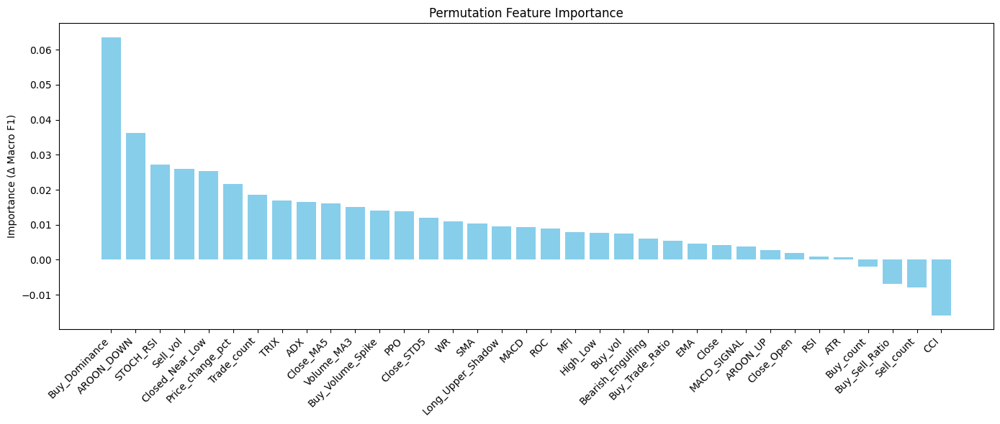


Features with very low importance (ΔF1 < 0.005):
 - Close: 0.004143
 - RSI: 0.001009
 - CCI: -0.015840
 - AROON_UP: 0.002814
 - EMA: 0.004644
 - MACD_SIGNAL: 0.003708
 - ATR: 0.000807
 - Close_Open: 0.001939
 - Buy_count: -0.002049
 - Sell_count: -0.007856
 - Buy_Sell_Ratio: -0.006933

===== Split 2 =====
Train class counts: {'Buy': 274, 'Hold': 562, 'Sell': 301}
Val class counts: {'Buy': 72, 'Hold': 78, 'Sell': 134}
Train: (1137, 5, 35), Val: (284, 5, 35)


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")



=== Classification Report: Split 2 ===
              precision    recall  f1-score   support

         Buy       0.54      0.10      0.16        72
        Hold       0.20      0.36      0.26        78
        Sell       0.40      0.40      0.40       134

    accuracy                           0.31       284
   macro avg       0.38      0.28      0.27       284
weighted avg       0.38      0.31      0.30       284

Accuracy: 0.3099
Macro F1-Score: 0.2737

Base F1 score: 0.2737
Feature 'Close': ΔF1 = -0.001696
Feature 'RSI': ΔF1 = 0.005308
Feature 'CCI': ΔF1 = 0.000151
Feature 'WR': ΔF1 = -0.005145
Feature 'TRIX': ΔF1 = 0.006751
Feature 'PPO': ΔF1 = -0.001341
Feature 'ADX': ΔF1 = -0.031710
Feature 'AROON_UP': ΔF1 = -0.015898
Feature 'AROON_DOWN': ΔF1 = -0.023889
Feature 'MFI': ΔF1 = -0.033449
Feature 'ROC': ΔF1 = -0.006407
Feature 'STOCH_RSI': ΔF1 = 0.019332
Feature 'EMA': ΔF1 = -0.001357
Feature 'SMA': ΔF1 = 0.002500
Feature 'MACD': ΔF1 = 0.000963
Feature 'MACD_SIGNAL': ΔF1 = 0.00099

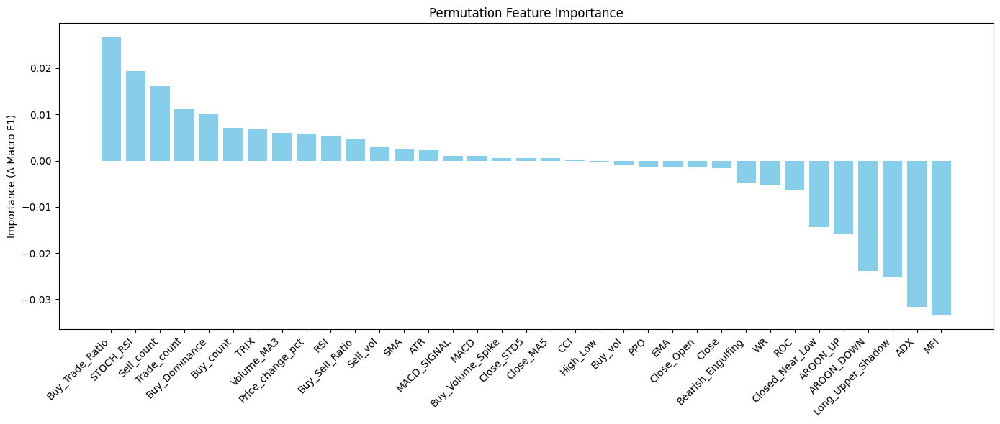


Features with very low importance (ΔF1 < 0.005):
 - Close: -0.001696
 - CCI: 0.000151
 - WR: -0.005145
 - PPO: -0.001341
 - ADX: -0.031710
 - AROON_UP: -0.015898
 - AROON_DOWN: -0.023889
 - MFI: -0.033449
 - ROC: -0.006407
 - EMA: -0.001357
 - SMA: 0.002500
 - MACD: 0.000963
 - MACD_SIGNAL: 0.000996
 - ATR: 0.002341
 - High_Low: -0.000153
 - Close_Open: -0.001437
 - Close_MA5: 0.000481
 - Close_STD5: 0.000481
 - Buy_vol: -0.000937
 - Sell_vol: 0.002893
 - Buy_Sell_Ratio: 0.004813
 - Buy_Volume_Spike: 0.000557
 - Long_Upper_Shadow: -0.025240
 - Bearish_Engulfing: -0.004689
 - Closed_Near_Low: -0.014309

===== Split 3 =====
Train class counts: {'Buy': 346, 'Hold': 640, 'Sell': 435}
Val class counts: {'Buy': 64, 'Hold': 140, 'Sell': 80}
Train: (1421, 5, 35), Val: (284, 5, 35)


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")



=== Classification Report: Split 3 ===
              precision    recall  f1-score   support

         Buy       0.15      0.20      0.17        64
        Hold       0.64      0.05      0.09       140
        Sell       0.25      0.59      0.35        80

    accuracy                           0.24       284
   macro avg       0.35      0.28      0.21       284
weighted avg       0.42      0.24      0.18       284

Accuracy: 0.2359
Macro F1-Score: 0.2060

Base F1 score: 0.2060
Feature 'Close': ΔF1 = 0.006900
Feature 'RSI': ΔF1 = -0.005866
Feature 'CCI': ΔF1 = -0.036466
Feature 'WR': ΔF1 = 0.012095
Feature 'TRIX': ΔF1 = -0.027444
Feature 'PPO': ΔF1 = 0.001780
Feature 'ADX': ΔF1 = 0.008108
Feature 'AROON_UP': ΔF1 = -0.026617
Feature 'AROON_DOWN': ΔF1 = -0.006426
Feature 'MFI': ΔF1 = -0.031876
Feature 'ROC': ΔF1 = 0.008321
Feature 'STOCH_RSI': ΔF1 = 0.005184
Feature 'EMA': ΔF1 = -0.000146
Feature 'SMA': ΔF1 = 0.000829
Feature 'MACD': ΔF1 = -0.006392
Feature 'MACD_SIGNAL': ΔF1 = -0.00729

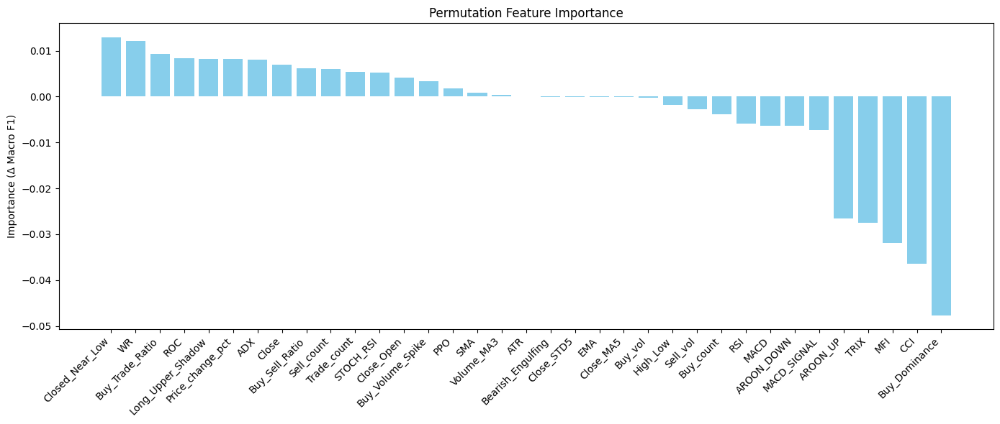


Features with very low importance (ΔF1 < 0.005):
 - RSI: -0.005866
 - CCI: -0.036466
 - TRIX: -0.027444
 - PPO: 0.001780
 - AROON_UP: -0.026617
 - AROON_DOWN: -0.006426
 - MFI: -0.031876
 - EMA: -0.000146
 - SMA: 0.000829
 - MACD: -0.006392
 - MACD_SIGNAL: -0.007295
 - ATR: 0.000048
 - High_Low: -0.001781
 - Close_Open: 0.004191
 - Close_MA5: -0.000147
 - Close_STD5: -0.000047
 - Volume_MA3: 0.000416
 - Buy_vol: -0.000180
 - Sell_vol: -0.002743
 - Buy_count: -0.003847
 - Buy_Volume_Spike: 0.003330
 - Buy_Dominance: -0.047657
 - Bearish_Engulfing: -0.000032

===== Split 4 =====
Train class counts: {'Buy': 410, 'Hold': 780, 'Sell': 515}
Val class counts: {'Buy': 78, 'Hold': 105, 'Sell': 101}
Train: (1705, 5, 35), Val: (284, 5, 35)


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")



=== Classification Report: Split 4 ===
              precision    recall  f1-score   support

         Buy       0.32      0.47      0.38        78
        Hold       0.52      0.13      0.21       105
        Sell       0.43      0.59      0.50       101

    accuracy                           0.39       284
   macro avg       0.42      0.40      0.36       284
weighted avg       0.43      0.39      0.36       284

Accuracy: 0.3908
Macro F1-Score: 0.3631

Base F1 score: 0.3631
Feature 'Close': ΔF1 = -0.005140
Feature 'RSI': ΔF1 = 0.010090
Feature 'CCI': ΔF1 = -0.001452
Feature 'WR': ΔF1 = -0.016325
Feature 'TRIX': ΔF1 = -0.014652
Feature 'PPO': ΔF1 = -0.005206
Feature 'ADX': ΔF1 = -0.007584
Feature 'AROON_UP': ΔF1 = -0.001118
Feature 'AROON_DOWN': ΔF1 = 0.000161
Feature 'MFI': ΔF1 = -0.008380
Feature 'ROC': ΔF1 = 0.010560
Feature 'STOCH_RSI': ΔF1 = -0.016431
Feature 'EMA': ΔF1 = 0.004146
Feature 'SMA': ΔF1 = -0.011285
Feature 'MACD': ΔF1 = -0.005621
Feature 'MACD_SIGNAL': ΔF1 = -0.00

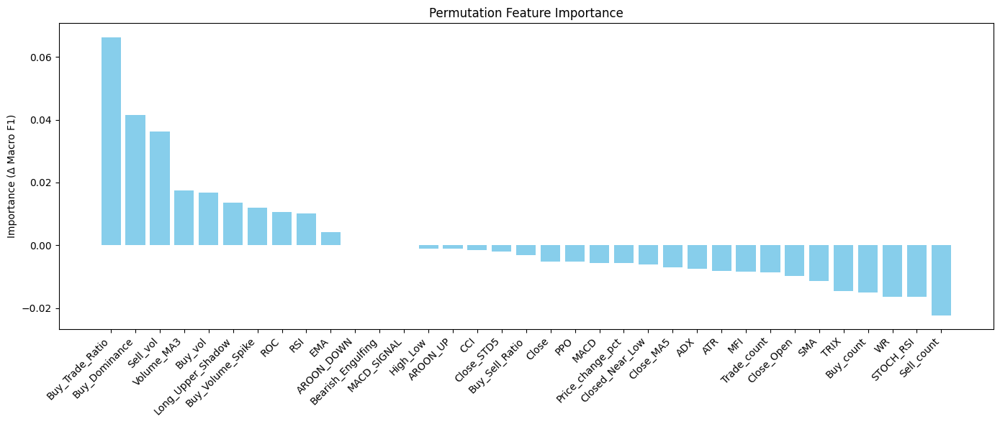


Features with very low importance (ΔF1 < 0.005):
 - Close: -0.005140
 - CCI: -0.001452
 - WR: -0.016325
 - TRIX: -0.014652
 - PPO: -0.005206
 - ADX: -0.007584
 - AROON_UP: -0.001118
 - AROON_DOWN: 0.000161
 - MFI: -0.008380
 - STOCH_RSI: -0.016431
 - EMA: 0.004146
 - SMA: -0.011285
 - MACD: -0.005621
 - MACD_SIGNAL: -0.000007
 - ATR: -0.008206
 - High_Low: -0.001016
 - Close_Open: -0.009698
 - Price_change_pct: -0.005650
 - Close_MA5: -0.007116
 - Close_STD5: -0.002069
 - Buy_count: -0.015027
 - Sell_count: -0.022310
 - Trade_count: -0.008655
 - Buy_Sell_Ratio: -0.003084
 - Bearish_Engulfing: 0.000000
 - Closed_Near_Low: -0.006174

===== Split 5 =====
Train class counts: {'Buy': 488, 'Hold': 885, 'Sell': 616}
Val class counts: {'Buy': 85, 'Hold': 103, 'Sell': 96}
Train: (1989, 5, 35), Val: (284, 5, 35)


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")



=== Classification Report: Split 5 ===
              precision    recall  f1-score   support

         Buy       0.34      0.32      0.33        85
        Hold       0.43      0.30      0.35       103
        Sell       0.35      0.48      0.40        96

    accuracy                           0.37       284
   macro avg       0.37      0.37      0.36       284
weighted avg       0.38      0.37      0.36       284

Accuracy: 0.3662
Macro F1-Score: 0.3618

Base F1 score: 0.3618
Feature 'Close': ΔF1 = -0.003265
Feature 'RSI': ΔF1 = 0.015903
Feature 'CCI': ΔF1 = 0.004928
Feature 'WR': ΔF1 = 0.048267
Feature 'TRIX': ΔF1 = -0.000421
Feature 'PPO': ΔF1 = -0.004029
Feature 'ADX': ΔF1 = -0.001698
Feature 'AROON_UP': ΔF1 = 0.012880
Feature 'AROON_DOWN': ΔF1 = -0.011611
Feature 'MFI': ΔF1 = 0.007364
Feature 'ROC': ΔF1 = 0.000626
Feature 'STOCH_RSI': ΔF1 = 0.001622
Feature 'EMA': ΔF1 = 0.000000
Feature 'SMA': ΔF1 = -0.003261
Feature 'MACD': ΔF1 = 0.000000
Feature 'MACD_SIGNAL': ΔF1 = -0.001593


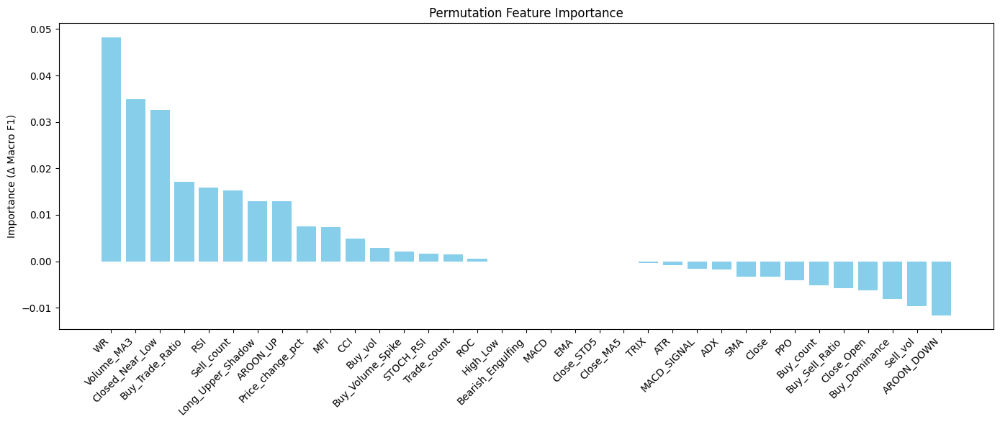


Features with very low importance (ΔF1 < 0.005):
 - Close: -0.003265
 - CCI: 0.004928
 - TRIX: -0.000421
 - PPO: -0.004029
 - ADX: -0.001698
 - AROON_DOWN: -0.011611
 - ROC: 0.000626
 - STOCH_RSI: 0.001622
 - EMA: 0.000000
 - SMA: -0.003261
 - MACD: 0.000000
 - MACD_SIGNAL: -0.001593
 - ATR: -0.000778
 - High_Low: 0.000008
 - Close_Open: -0.006213
 - Close_MA5: -0.000036
 - Close_STD5: -0.000019
 - Buy_vol: 0.002922
 - Sell_vol: -0.009613
 - Buy_count: -0.005230
 - Trade_count: 0.001445
 - Buy_Sell_Ratio: -0.005732
 - Buy_Volume_Spike: 0.002039
 - Buy_Dominance: -0.008154
 - Bearish_Engulfing: 0.000000

Saved best model from split 4 with F1 = 0.3971

Summary of each split:
Split 1: Accuracy=0.3380, Macro F1=0.3014
Split 2: Accuracy=0.3099, Macro F1=0.2737
Split 3: Accuracy=0.2359, Macro F1=0.2060
Split 4: Accuracy=0.3908, Macro F1=0.3631
Split 5: Accuracy=0.3662, Macro F1=0.3618

Base F1 score: 0.3631
Feature 'Close': ΔF1 = -0.005140
Feature 'RSI': ΔF1 = 0.009776
Feature 'CCI': ΔF1 = 

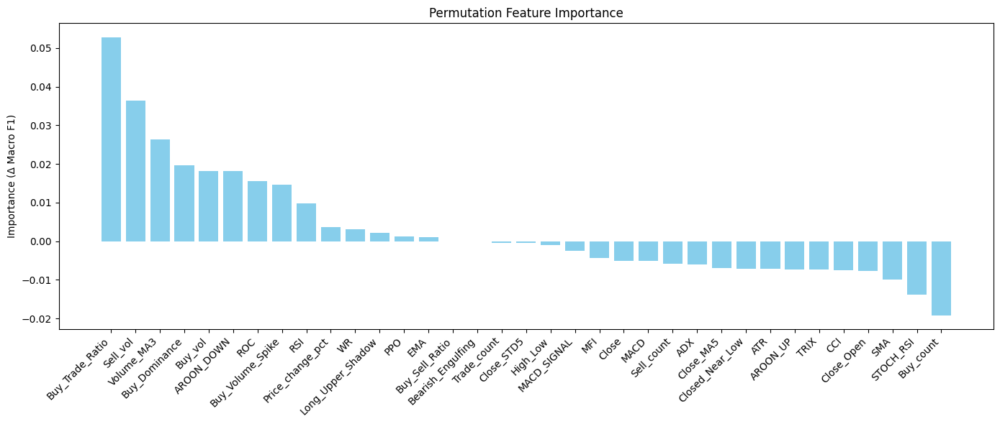


Features with very low importance (ΔF1 < 0.005):
 - Close: -0.005140
 - CCI: -0.007482
 - WR: 0.003092
 - TRIX: -0.007351
 - PPO: 0.001168
 - ADX: -0.005995
 - AROON_UP: -0.007286
 - MFI: -0.004338
 - STOCH_RSI: -0.013850
 - EMA: 0.001030
 - SMA: -0.009909
 - MACD: -0.005140
 - MACD_SIGNAL: -0.002515
 - ATR: -0.007185
 - High_Low: -0.001033
 - Close_Open: -0.007776
 - Price_change_pct: 0.003730
 - Close_MA5: -0.006864
 - Close_STD5: -0.000530
 - Buy_count: -0.019170
 - Sell_count: -0.005916
 - Trade_count: -0.000461
 - Buy_Sell_Ratio: 0.000000
 - Long_Upper_Shadow: 0.002175
 - Bearish_Engulfing: 0.000000
 - Closed_Near_Low: -0.007054

=== Overall Evaluation ===
              precision    recall  f1-score   support

         Buy       0.27      0.27      0.27       376
        Hold       0.41      0.24      0.31       590
        Sell       0.32      0.49      0.39       454

    accuracy                           0.33      1420
   macro avg       0.33      0.33      0.32      1420
wei

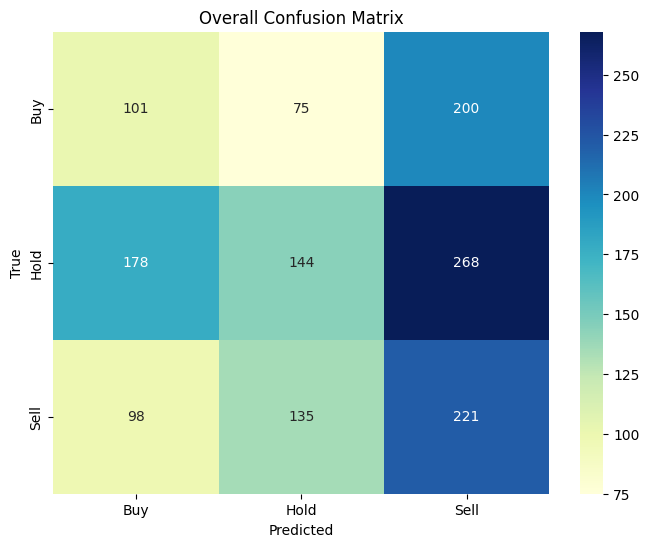

In [35]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    classification_report, accuracy_score, f1_score, confusion_matrix,
    precision_recall_fscore_support
)
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn as nn
import joblib  # สำหรับเซฟ label encoder

# ----------------------------
# Train Model Function
# ----------------------------
def train_model(X_train, y_train, X_val=None, y_val=None, num_classes=3, epochs=50):
    le = LabelEncoder()
    le.fit(['Buy', 'Hold', 'Sell'])
    y_train_enc = le.transform(y_train)

    if X_val is not None and y_val is not None:
        y_val_enc = le.transform(y_val)
        val_tensor_x = torch.tensor(X_val, dtype=torch.float32)
        val_tensor_y = torch.tensor(y_val_enc, dtype=torch.long)
        val_loader = DataLoader(TensorDataset(val_tensor_x, val_tensor_y), batch_size=32, shuffle=False)

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                      torch.tensor(y_train_enc, dtype=torch.long)),
        batch_size=32, shuffle=True)

    class_counts = np.bincount(y_train_enc)
    total_samples = len(y_train_enc)
    class_weights = total_samples / (class_counts + 1e-6)
    class_weights = class_weights / class_weights.sum() * len(class_weights)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)

    model = TransformerSignalPredictor(
        input_dim=X_train.shape[2], model_dim=128,
        num_heads=4, num_layers=2, num_classes=num_classes)

    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.05)
    optimizer = torch.optim.AdamW([
        {'params': model.embedding.parameters(), 'lr': 1e-4},
        {'params': model.transformer.parameters(), 'lr': 5e-5},
        {'params': model.classifier.parameters(), 'lr': 2e-4},
        {'params': model.positional_encoding, 'lr': 5e-4},
        {'params': model.attention_weights.parameters(), 'lr': 1e-4}
    ], weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

    best_val_f1 = 0
    best_model = None
    early_stop_count = 0

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        correct = 0
        total = 0

        for xb, yb in train_loader:
            optimizer.zero_grad()
            preds = model(xb)
            loss = criterion(preds, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            total_loss += loss.item()
            correct += (torch.argmax(preds, 1) == yb).sum().item()
            total += yb.size(0)

        if X_val is not None and y_val is not None:
            model.eval()
            val_preds_all, val_true_all = [], []
            with torch.no_grad():
                for xb, yb in val_loader:
                    preds = model(xb)
                    val_preds_all.extend(torch.argmax(preds, 1).cpu().numpy())
                    val_true_all.extend(yb.cpu().numpy())

            val_f1 = f1_score(val_true_all, val_preds_all, average='macro')
            if val_f1 > best_val_f1:
                best_val_f1 = val_f1
                best_model = model.state_dict().copy()
                early_stop_count = 0
            else:
                early_stop_count += 1
            scheduler.step()
            if early_stop_count >= 5:
                break

    if best_model:
        model.load_state_dict(best_model)
    return model, le, best_val_f1

# evaluate_model
def evaluate_model(model, le, X_test, y_test, split_id=None, save_plots=False):
    def clean_labels(y_array):
        valid_labels = set(le.classes_)
        y_cleaned = []
        for i, label in enumerate(y_array):
            if label not in valid_labels:
                print(f"Warning: Found invalid label '{label}' at index {i}, replacing with 'Hold'")
                y_cleaned.append('Hold')
            else:
                y_cleaned.append(label)
        return np.array(y_cleaned)

    y_test = clean_labels(y_test)
    y_test_enc = le.transform(y_test)

    model.eval()
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    all_preds = []

    batch_size = 64
    with torch.no_grad():
        for i in range(0, X_test.shape[0], batch_size):
            batch = X_test_tensor[i:i+batch_size]
            outputs = model(batch)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)
            all_preds.append(preds.cpu().numpy())

    y_pred_enc = np.concatenate(all_preds)
    y_pred = le.inverse_transform(y_pred_enc)
    y_true = le.inverse_transform(y_test_enc)

    print(f"\n=== Classification Report: Split {split_id} ===")
    print(classification_report(y_true, y_pred, target_names=le.classes_))
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average='macro')
    print(f"Accuracy: {acc:.4f}")
    print(f"Macro F1-Score: {f1:.4f}")

    # Save report as dictionary
    metrics = {
        'split': split_id,
        'accuracy': acc,
        'macro_f1': f1,
        'report': classification_report(y_true, y_pred, target_names=le.classes_, output_dict=True)
    }

    if save_plots:
        # Confusion Matrix
        cm = confusion_matrix(y_true, y_pred, labels=le.classes_)
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=le.classes_, yticklabels=le.classes_)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(f"Confusion Matrix - Split {split_id}")
        plt.tight_layout()
        plt.savefig(f"confusion_matrix_split_{split_id}.png")
        plt.close()

    return y_pred, y_true, metrics

# ----------------------------
# Feature Importance Functions
# ----------------------------
INDICATOR_FEATURES = [
    'Close', 'RSI', 'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 
    'AROON_UP', 'AROON_DOWN', 'MFI', 'ROC', 'STOCH_RSI', 
    'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR',
    'High_Low','Close_Open', 'Price_change_pct',
    'Close_MA5', 'Close_STD5', 'Volume_MA3','Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count',
    'Buy_Sell_Ratio', 'Buy_Trade_Ratio', 'Buy_Volume_Spike', 'Buy_Dominance',
    "Long_Upper_Shadow", "Bearish_Engulfing", 
    "Closed_Near_Low"
]


def compute_feature_importance(model, X_val, y_val, le, feature_names=None, n_repeats=5):
    model.eval()
    with torch.no_grad():
        base_preds = model(torch.tensor(X_val, dtype=torch.float32))
        base_preds = torch.argmax(base_preds, dim=1).cpu().numpy()

    y_true_enc = le.transform(y_val)
    base_f1 = f1_score(y_true_enc, base_preds, average='macro')
    print(f"\nBase F1 score: {base_f1:.4f}")

    importances = []
    for i in range(X_val.shape[2]):
        scores = []
        for _ in range(n_repeats):
            X_shuffled = X_val.copy()
            shuffle_idx = np.random.permutation(X_val.shape[0])
            X_shuffled[:, :, i] = X_shuffled[shuffle_idx, :, i]

            with torch.no_grad():
                preds = model(torch.tensor(X_shuffled, dtype=torch.float32))
                pred_enc = torch.argmax(preds, dim=1).cpu().numpy()

            f1 = f1_score(y_true_enc, pred_enc, average='macro')
            scores.append(base_f1 - f1)

        feature_importance = np.mean(scores)
        importances.append(feature_importance)

        fname = feature_names[i] if feature_names is not None else f"Feature {i}"
        print(f"Feature '{fname}': ΔF1 = {feature_importance:.6f}")

    return np.array(importances)

def evaluate_feature_importance(model, le, X_val, y_val):
    feature_names = INDICATOR_FEATURES  
    importances = compute_feature_importance(model, X_val, y_val, le, feature_names=feature_names)
    sorted_idx = np.argsort(importances)[::-1]

    plt.figure(figsize=(14, 6))
    plt.bar([feature_names[i] for i in sorted_idx], importances[sorted_idx], color='skyblue')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Importance (Δ Macro F1)")
    plt.title("Permutation Feature Importance")
    plt.tight_layout()
    plt.show()

    low_threshold = 0.005
    low_impact_features = [(feature_names[i], imp) for i, imp in enumerate(importances) if imp < low_threshold]
    print(f"\nFeatures with very low importance (ΔF1 < {low_threshold}):")
    for fname, score in low_impact_features:
        print(f" - {fname}: {score:.6f}")

# ----------------------------
# Walk-Forward Expanding Window
# ----------------------------
def walk_forward_expanding_window(X, y, model_fn, initial_window=0.3, step=0.05, min_train_size=100, max_splits=10):
    n_samples = X.shape[0]
    split_start = int(n_samples * initial_window)
    step_size = int(n_samples * step)

    all_preds = []
    all_trues = []
    split_id = 1
    split_metrics = []

    best_acc = 0
    best_model_state = None
    best_label_encoder = None
    final_model = None
    final_X_val = None
    final_y_val = None

    while split_start + step_size < n_samples and split_id <= max_splits:
        train_end = split_start
        val_end = split_start + step_size

        X_train, y_train = X[:train_end], y[:train_end]
        X_val, y_val = X[train_end:val_end], y[train_end:val_end]

        unique_train = np.unique(y_train)
        unique_val = np.unique(y_val)
        if len(unique_train) < 3 or len(unique_val) < 3:
            print(f"Skipping split {split_id} — not enough label diversity. "
                  f"(train: {unique_train}, val: {unique_val})")
            split_start += 1
            continue

        print(f"\n===== Split {split_id} =====")
        print("Train class counts:", dict(zip(*np.unique(y_train, return_counts=True))))
        print("Val class counts:", dict(zip(*np.unique(y_val, return_counts=True))))
        print(f"Train: {X_train.shape}, Val: {X_val.shape}")

        model, le, val_f1 = model_fn(X_train, y_train, X_val, y_val)
        y_pred, y_true, metrics = evaluate_model(model, le, X_val, y_val, split_id=split_id, save_plots=True)

        all_preds.extend(y_pred)
        all_trues.extend(y_true)
        split_metrics.append(metrics)

        if val_f1 > best_acc:
            best_acc = val_f1
            best_model_state = model.state_dict()
            best_label_encoder = le
            best_split_id = split_id
            final_model = model
            final_X_val = X_val
            final_y_val = y_val

        evaluate_feature_importance(model, le, X_val, y_val)

        split_start += step_size
        split_id += 1

    if best_model_state and best_label_encoder:
        torch.save(best_model_state, "transformer_model.pth")
        joblib.dump(best_label_encoder, "label_encoder.pkl")
        print(f"\nSaved best model from split {best_split_id} with F1 = {best_acc:.4f}")

    return all_preds, all_trues, final_model, final_X_val, final_y_val, best_label_encoder, split_metrics

# ----------------------------
# เรียกใช้ Walk-Forward
# ----------------------------
y_preds_all, y_trues_all, final_model, final_X_val, final_y_val, le, all_split_metrics = walk_forward_expanding_window(
    X15, y15, model_fn=train_model,
    initial_window=0.3, step=0.1, max_splits=5
)

# สรุปรวมผลลัพธ์ทุก Split
print("\nSummary of each split:")
for m in all_split_metrics:
    print(f"Split {m['split']}: Accuracy={m['accuracy']:.4f}, Macro F1={m['macro_f1']:.4f}")

evaluate_feature_importance(final_model, le, final_X_val, final_y_val)


# สรุปผลรวมทุกชุด
print("\n=== Overall Evaluation ===")
print(classification_report(y_trues_all, y_preds_all))
cm = confusion_matrix(y_trues_all, y_preds_all, labels=['Buy', 'Hold', 'Sell'])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', xticklabels=['Buy', 'Hold', 'Sell'], yticklabels=['Buy', 'Hold', 'Sell'])
plt.title("Overall Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


Backtest

In [37]:
pip install mplcursors


Note: you may need to restart the kernel to use updated packages.


In [38]:
import matplotlib.dates as mdates

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning:

enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)

C:\Users\User\AppData\Local\Temp\ipykernel_6976\2990809149.py:34: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.




Class Counts for DELTA: {'Buy': 45, 'Hold': 83, 'Sell': 49}
Final Cumulative Return: 1.4582 (45.82%)
Winning Days: 35 / 176
Losing Days: 29 / 176


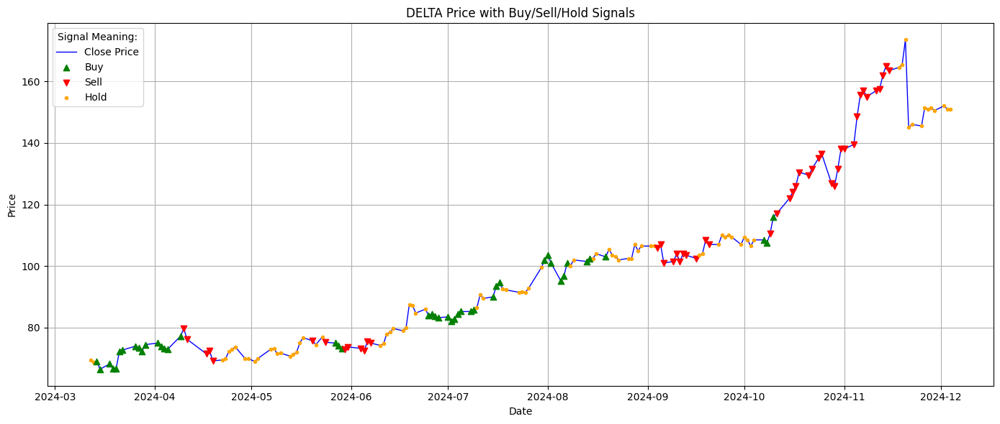

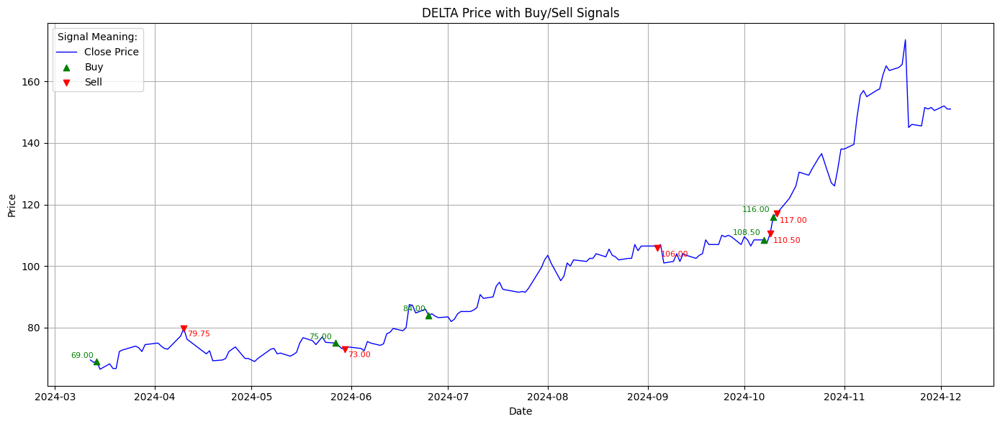

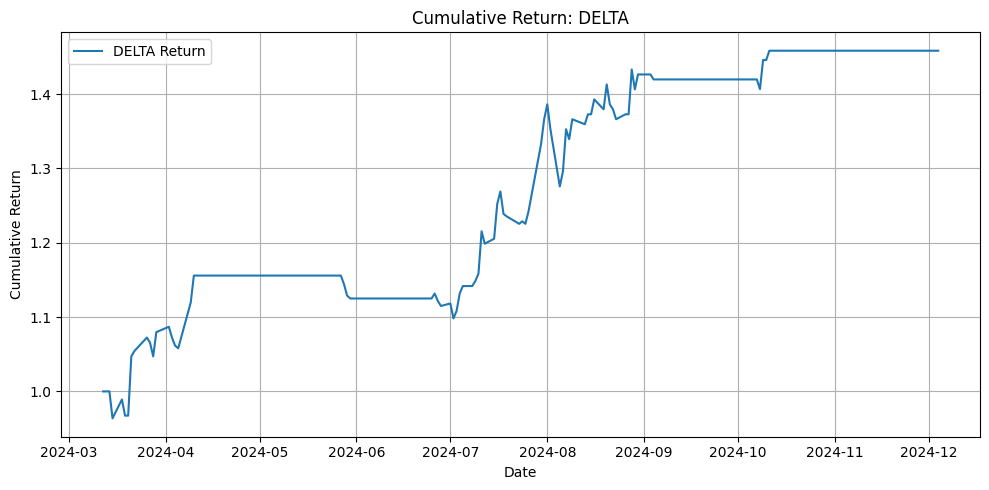


Class Counts for EGCO: {'Buy': 16, 'Hold': 107, 'Sell': 54}
Final Cumulative Return: 0.9971 (-0.29%)
Winning Days: 8 / 176
Losing Days: 9 / 176


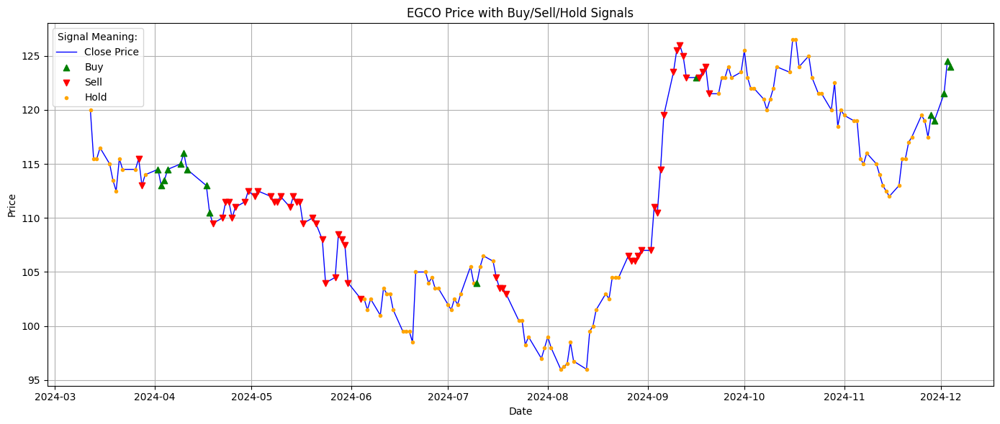

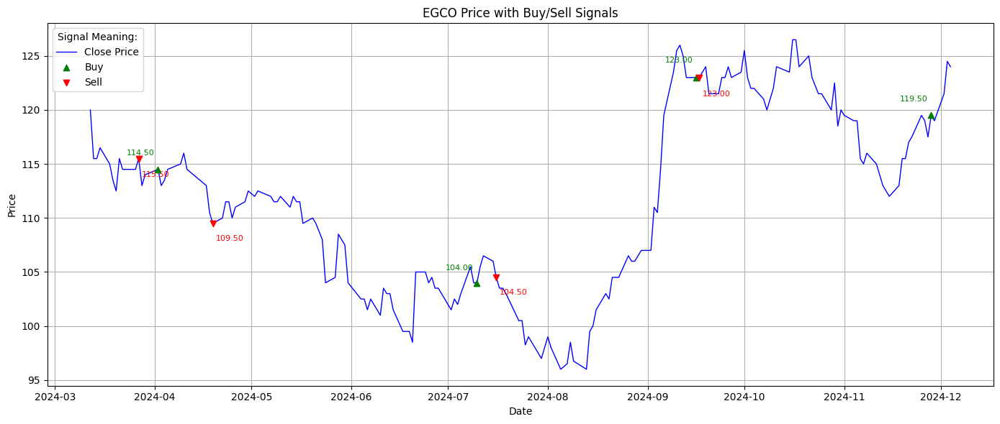

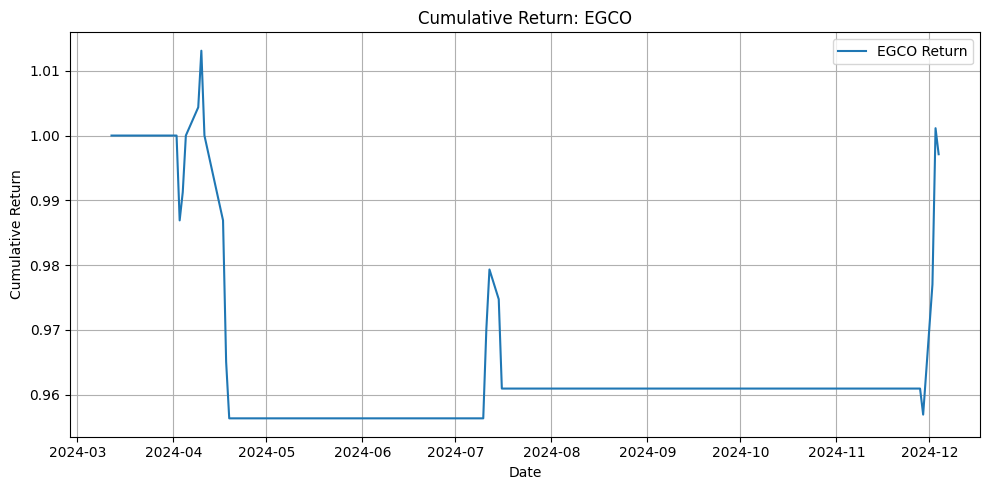


Class Counts for TOP: {'Buy': 32, 'Hold': 97, 'Sell': 48}
Final Cumulative Return: 0.8513 (-14.87%)
Winning Days: 35 / 176
Losing Days: 38 / 176


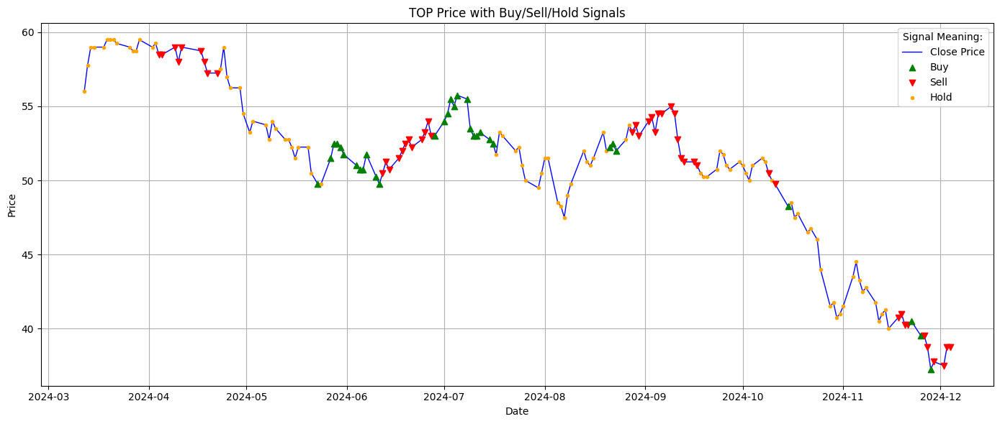

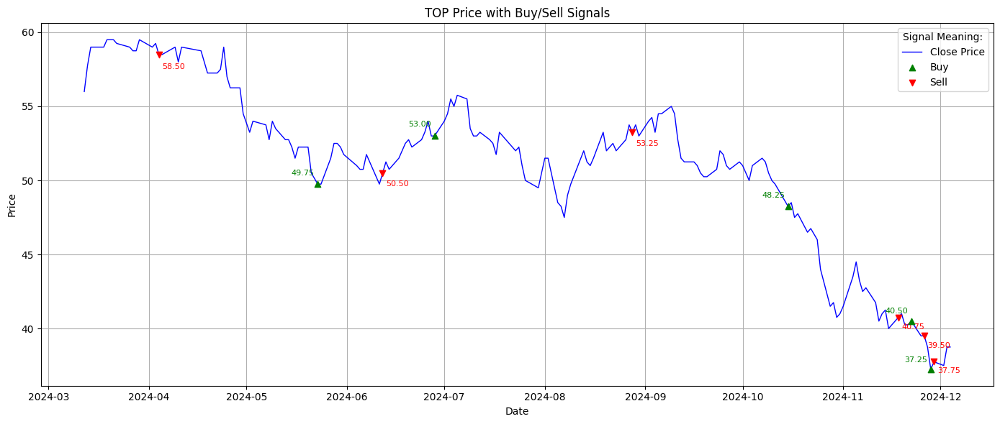

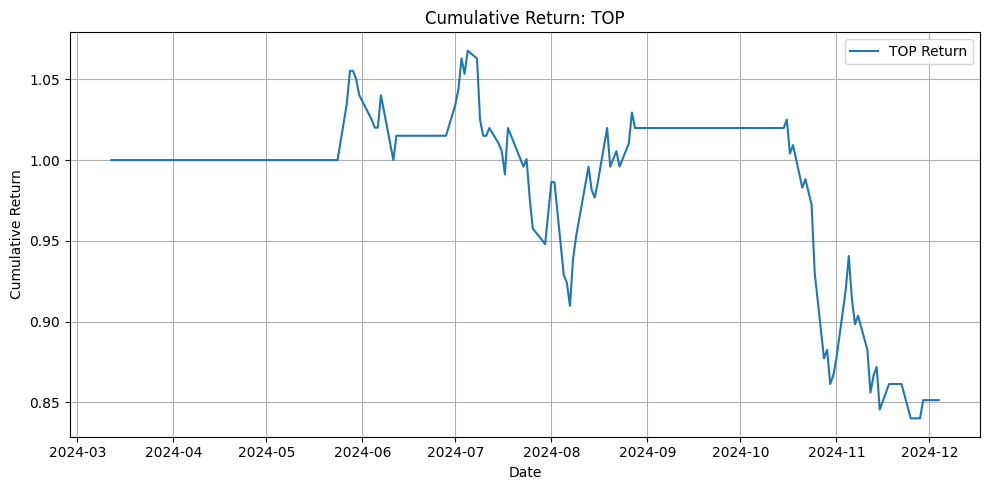


Class Counts for PTT: {'Buy': 54, 'Hold': 96, 'Sell': 27}
Final Cumulative Return: 0.9427 (-5.73%)
Winning Days: 41 / 176
Losing Days: 50 / 176


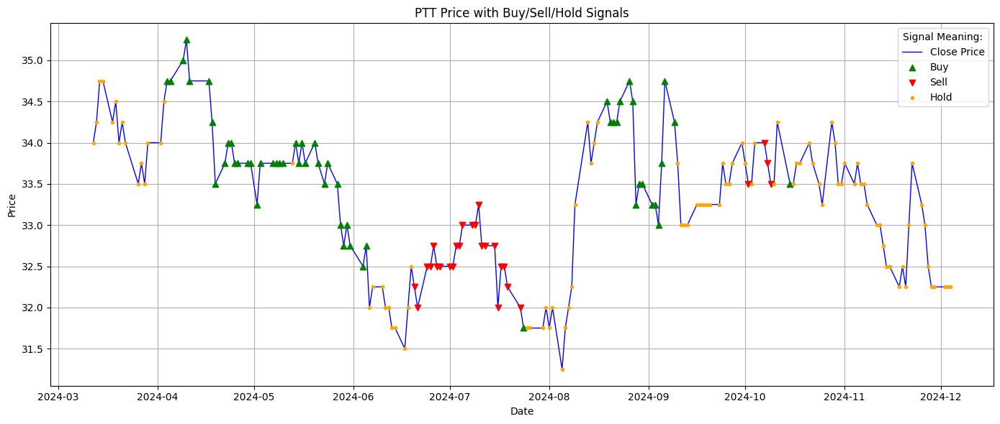

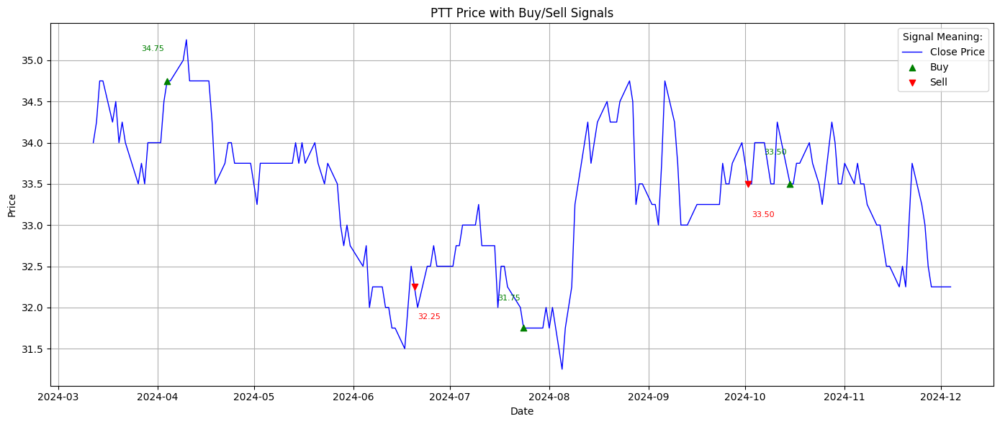

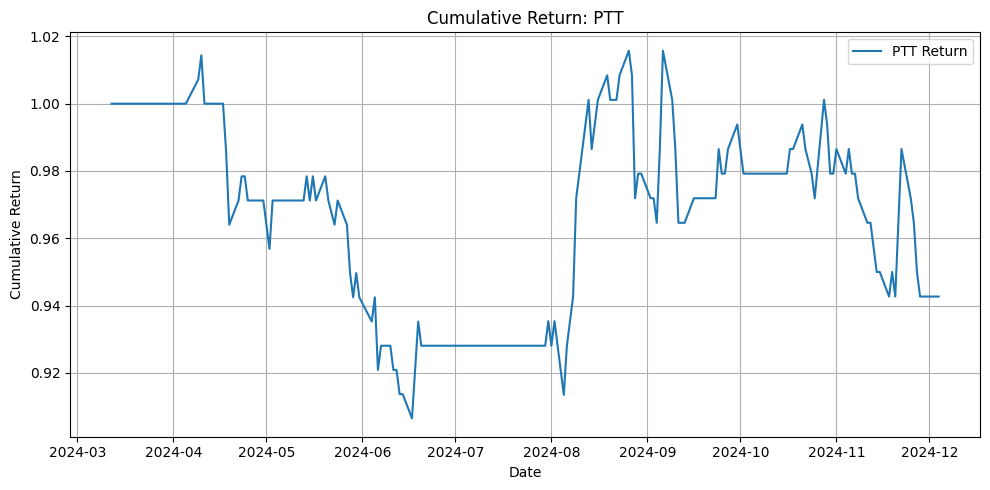


Class Counts for CPF: {'Buy': 11, 'Hold': 61, 'Sell': 105}
Final Cumulative Return: 1.0341 (3.41%)
Winning Days: 4 / 176
Losing Days: 4 / 176


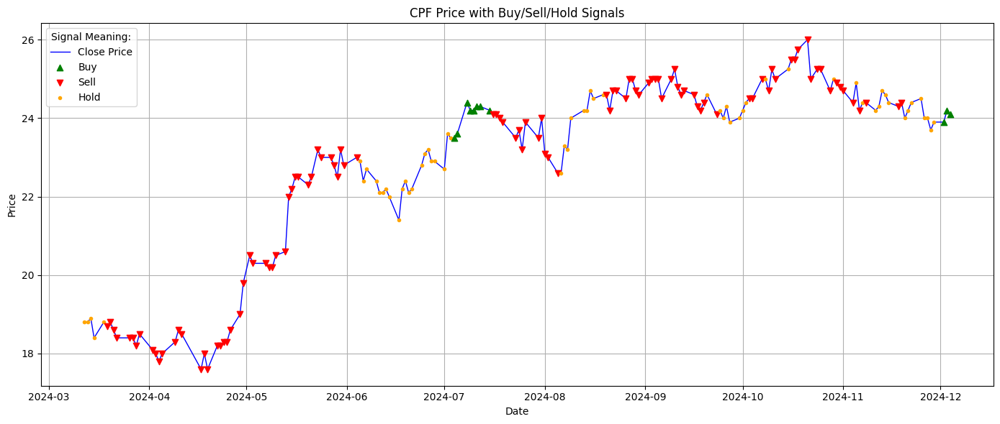

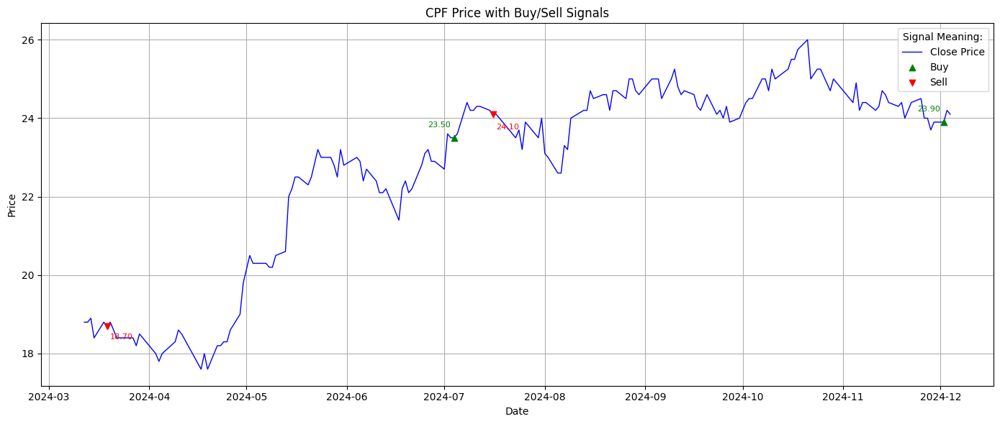

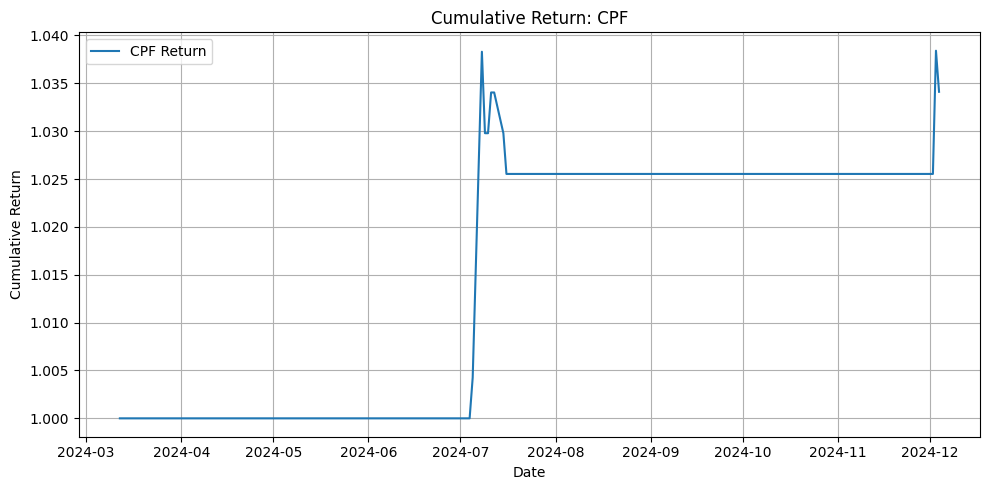

In [44]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import joblib
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import matplotlib.pyplot as plt
import pymysql
import sys
import os


# ===== เพิ่ม path ไปยัง transformer.ipynb ที่ convert เป็น .py แล้ว ===== #
sys.path.append("C:/ideatrade/model")
from transformer import TransformerSignalPredictor

# ===== DATABASE CONNECTION ===== #
def connect_database():
    return pymysql.connect(
        host="ideatrade.serveftp.net",
        port=51410,
        user="Kanokwan@Namfon",
        password="lTGnGcygfnRqU_ps",
        database="db_ideatrade"
    )

def get_stock_data(conn, start_date, end_date):
    query = """
    SELECT Symbol, Datetime, Open, High, Low, Close, Volume
    FROM stock_hloc
    WHERE Datetime BETWEEN %s AND %s
    ORDER BY Symbol, Datetime
    """
    df = pd.read_sql(query, conn, params=(start_date, end_date))
    df['Datetime'] = pd.to_datetime(df['Datetime'])
    return df

# ===== TECHNICAL INDICATORS (ย่อไว้) ===== #
def add_technical_indicators(df):
    def rsi(series, period=14):
        delta = series.diff()
        gain = delta.where(delta > 0, 0.0)
        loss = -delta.where(delta < 0, 0.0)
        avg_gain = gain.rolling(window=period).mean()
        avg_loss = loss.rolling(window=period).mean().replace(0, 0.0001)
        rs = avg_gain / avg_loss
        return 100 - (100 / (1 + rs))

    def cci(df, period=20):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        ma = tp.rolling(period).mean()
        md = tp.rolling(period).apply(lambda x: abs(x - x.mean()).mean(), raw=True).replace(0, 0.0001)
        return (tp - ma) / (0.015 * md)

    def williams_r(df, period=14):
        high = df['High'].rolling(period).max()
        low = df['Low'].rolling(period).min()
        denom = (high - low).replace(0, 0.0001)
        return -100 * (high - df['Close']) / denom

    def trix(series, period=15):
        ema1 = series.ewm(span=period).mean()
        ema2 = ema1.ewm(span=period).mean()
        ema3 = ema2.ewm(span=period).mean()
        return ema3.pct_change() * 100

    def ppo(series, fast=12, slow=26):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean().replace(0, 0.0001)
        return (ema_fast - ema_slow) / ema_slow * 100

    def adx(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        plus_dm = high.diff()
        minus_dm = low.diff()
        plus_dm[plus_dm < 0] = 0
        minus_dm[minus_dm > 0] = 0
        tr1 = high - low
        tr2 = abs(high - close.shift())
        tr3 = abs(low - close.shift())
        tr = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)
        atr = tr.rolling(period).mean()
        plus_di = 100 * (plus_dm.rolling(period).mean() / atr).replace(0, 0.0001)
        minus_di = abs(100 * (minus_dm.rolling(period).mean() / atr)).replace(0, 0.0001)
        dx = (abs(plus_di - minus_di) / (plus_di + minus_di)).replace(0, 0.0001) * 100
        return dx.rolling(period).mean()

    def aroon(df, period=25):
        aroon_up = df['High'].rolling(window=period).apply(lambda x: float(x.argmax()) / period * 100, raw=True)
        aroon_down = df['Low'].rolling(window=period).apply(lambda x: float(x.argmin()) / period * 100, raw=True)
        return aroon_up, aroon_down

    def mfi(df, period=14):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        mf = tp * df['Volume']
        pos_mf = mf.where(tp > tp.shift(), 0.0)
        neg_mf = mf.where(tp < tp.shift(), 0.0)
        pos_sum = pos_mf.rolling(period).sum()
        neg_sum = neg_mf.rolling(period).sum().replace(0, 0.0001)
        mfr = pos_sum / neg_sum
        return 100 - (100 / (1 + mfr))

    def roc(series, period=12):
        return series.pct_change(periods=period) * 100

    def stochastic_rsi(series, period=14):
        rsi_series = rsi(series, period)
        min_val = rsi_series.rolling(period).min()
        max_val = rsi_series.rolling(period).max()
        return (rsi_series - min_val) / (max_val - min_val + 1e-6)

    def ema(series, period=14):
        return series.ewm(span=period).mean()

    def sma(series, period=14):
        return series.rolling(window=period).mean()

    def macd(series, fast=12, slow=26, signal=9):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean()
        macd_line = ema_fast - ema_slow
        signal_line = macd_line.ewm(span=signal).mean()
        return macd_line, signal_line

    def atr(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        tr = pd.concat([
            high - low,
            abs(high - close.shift()),
            abs(low - close.shift())
        ], axis=1).max(axis=1)
        return tr.rolling(period).mean()

    def bollinger_bands(series, period=20, num_std=2):
        sma = series.rolling(window=period).mean()
        std = series.rolling(window=period).std()
        upper_band = sma + (num_std * std)
        lower_band = sma - (num_std * std)
        return upper_band, lower_band



    # คำนวณ indicators สำหรับแต่ละ symbol แยกกัน
    result_df = pd.DataFrame()

    for symbol in df['Symbol'].unique():
        symbol_df = df[df['Symbol'] == symbol].copy()

        symbol_df['RSI'] = rsi(symbol_df['Close'])
        symbol_df['CCI'] = cci(symbol_df)
        symbol_df['WR'] = williams_r(symbol_df)
        symbol_df['TRIX'] = trix(symbol_df['Close'])
        symbol_df['PPO'] = ppo(symbol_df['Close'])
        symbol_df['ADX'] = adx(symbol_df)
        symbol_df['AROON_UP'], symbol_df['AROON_DOWN'] = aroon(symbol_df)
        symbol_df['MFI'] = mfi(symbol_df)
        symbol_df['ROC'] = roc(symbol_df['Close'])
        symbol_df['STOCH_RSI'] = stochastic_rsi(symbol_df['Close'])
        symbol_df['EMA'] = ema(symbol_df['Close'])
        symbol_df['SMA'] = sma(symbol_df['Close'])
        symbol_df['MACD'], symbol_df['MACD_SIGNAL'] = macd(symbol_df['Close'])
        symbol_df['ATR'] = atr(symbol_df)

        result_df = pd.concat([result_df, symbol_df])

    # ลบแถวที่มีค่า NaN และ reset index
    result_df = result_df.dropna().reset_index(drop=True)
    return result_df


# ===== SEQUENCE WINDOWING ===== #
def create_sequences(data, window_size=15):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

# ===== BACKTEST STRATEGY ===== #
def backtest_strategy(prices, signals):
    position = 0  # 0 = no position, 1 = long
    daily_returns = []
    strategy_returns = []

    entry_points = []
    exit_points = []

    for i in range(1, len(prices)):
        signal = signals[i - 1]

        # Entry logic
        if signal == 'Buy' and position == 0:
            position = 1
            entry_points.append(i)

        # Exit logic
        elif signal == 'Sell' and position == 1:
            position = 0
            exit_points.append(i)

        daily_return = (prices[i] - prices[i - 1]) / prices[i - 1]
        strategy_return = position * daily_return
        daily_returns.append(strategy_return)
        strategy_returns.append(strategy_return)

    cumulative_returns = np.cumprod([1] + [r + 1 for r in strategy_returns])
    return daily_returns, cumulative_returns, entry_points, exit_points



# ===== LOAD MODEL ===== #
model_path = "C:\\ideatrade\\model\\transformer_model.pth"
label_encoder_path = "C:\ideatrade\model\label_encoder.pkl"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = TransformerSignalPredictor(input_dim=35, model_dim=128, num_heads=4, num_layers=2, num_classes=3)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()


label_encoder = joblib.load(label_encoder_path)


# ===== BACKTEST SELECTED SYMBOLS ===== #
selected_symbols = ['DELTA', 'EGCO', 'TOP', 'PTT', 'CPF']

conn = connect_database()
df_raw = get_stock_data(conn, '2023-12-31', '2024-12-31')
results = {}

# df_symbol = df_raw[df_raw['Symbol'] == symbol].copy()

for symbol in selected_symbols:
    df_symbol = df_raw[df_raw['Symbol'] == symbol].copy()

    if df_symbol.empty:
        print(f"{symbol}: ไม่มีข้อมูลในช่วงเวลานี้")
        continue

    # เพิ่มคอลัมน์ Date และแปลงให้อยู่ใน datetime64[ns]
    df_symbol['Date'] = df_symbol['Datetime'].dt.normalize()
    df_tick_features['Date'] = pd.to_datetime(df_tick_features['Date'])

    # รวมข้อมูล tick features
    df_symbol = pd.merge(
        df_symbol,
        df_tick_features[df_tick_features['Symbol'] == symbol],
        how='left',
        on=['Symbol', 'Date']
    )

    # เติมค่า NaN ที่อาจเกิดขึ้นจากการ merge
    for col in ['Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count']:
        df_symbol[col] = df_symbol[col].fillna(0)
    df_symbol = add_technical_indicators(df_symbol)

    # เติม OHLCV-tickmatch features
    df_symbol['High_Low']         = df_symbol['High'] - df_symbol['Low']
    df_symbol['Close_Open']       = df_symbol['Close'] - df_symbol['Open']
    df_symbol['Price_change_pct'] = df_symbol['Close'].pct_change()
    df_symbol['Close_MA5']        = df_symbol['Close'].rolling(window=5).mean()
    df_symbol['Close_STD5']       = df_symbol['Close'].rolling(window=5).std()
    df_symbol['Volume_MA5']       = df_symbol['Volume'].rolling(window=5).mean()

    df_symbol['Buy_Sell_Ratio'] = df_symbol['Buy_vol'] / (df_symbol['Sell_vol'] + 1)
    df_symbol['Buy_Trade_Ratio'] = df_symbol['Buy_count'] / (df_symbol['Trade_count'] + 1)
    df_symbol['Buy_Volume_Spike'] = df_symbol['Buy_vol'] / (df_symbol['Buy_vol'].rolling(5).mean() + 1e-6)
    df_symbol['Buy_Dominance'] = (df_symbol['Buy_vol'] - df_symbol['Sell_vol']) / (df_symbol['Buy_vol'] + df_symbol['Sell_vol'] + 1)

    # 1. Upper shadow
    df_symbol["Upper_Shadow"] = df_symbol["High"] - df_symbol[["Open", "Close"]].max(axis=1)
    df_symbol["Long_Upper_Shadow"] = (df_symbol["Upper_Shadow"] > (df_symbol["High"] - df_symbol["Low"]) * 0.6).astype(int)

    # 2. Bearish engulfing
    df_symbol["Prev_Close"] = df_symbol["Close"].shift(1)
    df_symbol["Prev_Open"] = df_symbol["Open"].shift(1)
    df_symbol["Bearish_Engulfing"] = (
        (df_symbol["Prev_Close"] > df_symbol["Prev_Open"]) &
        (df_symbol["Open"] > df_symbol["Close"]) &
        (df_symbol["Open"] > df_symbol["Prev_Close"]) &
        (df_symbol["Close"] < df_symbol["Prev_Open"])
    ).astype(int)

    # 3. Close near low
    df_symbol["Close_to_Low_Pct"] = (df_symbol["Close"] - df_symbol["Low"]) / (df_symbol["High"] - df_symbol["Low"] + 1e-6)
    df_symbol["Closed_Near_Low"] = (df_symbol["Close_to_Low_Pct"] < 0.2).astype(int)



    # ลบ NaN ที่เกิดจากการ shift/rolling
    df_symbol = df_symbol.dropna().reset_index(drop=True)

    feature_cols = [
    'Close', 'RSI', 'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 
    'AROON_UP', 'AROON_DOWN', 'MFI', 'ROC', 'STOCH_RSI', 
    'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR',
    'High_Low','Close_Open', 'Price_change_pct',
    'Close_MA5', 'Close_STD5', 'Volume_MA5','Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count',
    'Buy_Sell_Ratio', 'Buy_Trade_Ratio', 'Buy_Volume_Spike', 'Buy_Dominance',
    "Long_Upper_Shadow", "Bearish_Engulfing", 
    "Closed_Near_Low"
]

    if df_symbol[feature_cols].isnull().any().any() or len(df_symbol) < 30:
        print(f"{symbol} ข้อมูลไม่พอหรือมี NaN")
        continue

    features = df_symbol[feature_cols].values
    scaler = MinMaxScaler()
    features_scaled = scaler.fit_transform(features)

    sequences = create_sequences(features_scaled, window_size=15)
    prices = df_symbol['Close'].values[15:]
    datetimes = df_symbol['Datetime'].values[15:]

    if len(sequences) != len(prices):
        print(f"{symbol}: ความยาว sequence ไม่ตรงกับราคาหลัง window")
        continue

    with torch.no_grad():
        inputs = torch.tensor(sequences, dtype=torch.float32).to(device)
        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()

    decoded = label_encoder.inverse_transform(preds)

    # ===== Count Preds for Each Class ===== #
    class_counts = {
        'Buy': (decoded == 'Buy').sum(),
        'Hold': (decoded == 'Hold').sum(),
        'Sell': (decoded == 'Sell').sum()
    }
    print(f"\nClass Counts for {symbol}: {class_counts}")

    if len(set(decoded)) < 2:
        print(f"{symbol}: คำทำนายมีคลาสเดียว")
        continue

    # ===== Backtest ===== #
    daily_returns, cum_returns, entry_points, exit_points = backtest_strategy(prices, decoded)
    results[symbol] = cum_returns

    total_return = cum_returns[-1]
    percent_return = (total_return - 1) * 100
    avg_daily_return = np.mean(daily_returns) * 100
    std_daily_return = np.std(daily_returns) * 100
    winning_days = (np.array(daily_returns) > 0).sum()
    losing_days = (np.array(daily_returns) < 0).sum()

    print(f"Final Cumulative Return: {total_return:.4f} ({percent_return:.2f}%)")
    print(f"Winning Days: {winning_days} / {len(daily_returns)}")
    print(f"Losing Days: {losing_days} / {len(daily_returns)}")

    # ===== Plot Signal on Price Chart ===== #
    plt.figure(figsize=(14, 6))
    plt.plot(datetimes, prices, label='Close Price', color='blue', linewidth=1)

    # วาดสัญญาณ Buy/Sell/Hold แต่ไม่ใส่ label เพื่อไม่ให้ legend ซ้ำ
    for i, signal in enumerate(decoded):
        if signal == 'Buy':
            plt.scatter(datetimes[i], prices[i], marker='^', color='green', zorder=5)
        elif signal == 'Sell':
            plt.scatter(datetimes[i], prices[i], marker='v', color='red', zorder=5)
        elif signal == 'Hold':
            plt.scatter(datetimes[i], prices[i], marker='.', color='orange', zorder=5)

    # สร้าง dummy points เพื่อใช้ใน legend อย่างละอัน
    plt.scatter([], [], marker='^', color='green', label='Buy')
    plt.scatter([], [], marker='v', color='red', label='Sell')
    plt.scatter([], [], marker='.', color='orange', label='Hold')

    plt.title(f'{symbol} Price with Buy/Sell/Hold Signals')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(title='Signal Meaning:')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ===== Plot Signal on Price Chart ===== #
    import matplotlib.dates as mdates

    plt.figure(figsize=(14, 6))
    plt.plot(datetimes, prices, label='Close Price', color='blue', linewidth=1)

    last_signal = None  # ใช้เก็บสัญญาณก่อนหน้า

    for i, signal in enumerate(decoded):
        if signal == 'Buy' and last_signal != 'Buy':
            plt.scatter(datetimes[i], prices[i], marker='^', color='green', zorder=5)
            # เลื่อนข้อความไปทางซ้ายประมาณ 2 วัน (2 หน่วย datetime)
            plt.text(mdates.date2num(datetimes[i]) - 1, prices[i] + (prices[i] * 0.01),  
                    f'{prices[i]:.2f}', color='green', fontsize=8, ha='right', va='bottom')
            last_signal = 'Buy'
        elif signal == 'Sell' and last_signal != 'Sell':
            plt.scatter(datetimes[i], prices[i], marker='v', color='red', zorder=5)
            # เลื่อนข้อความไปทางขวาประมาณ 2 วัน
            plt.text(mdates.date2num(datetimes[i]) + 1, prices[i] - (prices[i] * 0.01),  
                    f'{prices[i]:.2f}', color='red', fontsize=8, ha='left', va='top')
            last_signal = 'Sell'

    # สร้าง dummy points เพื่อใช้ใน legend
    plt.scatter([], [], marker='^', color='green', label='Buy')
    plt.scatter([], [], marker='v', color='red', label='Sell')

    plt.title(f'{symbol} Price with Buy/Sell Signals')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(title='Signal Meaning:')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # ===== SHOW RESULT ===== #
    plt.figure(figsize=(10, 5))
    plt.plot(datetimes, cum_returns, label=f'{symbol} Return')
    plt.title(f'Cumulative Return: {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

conn.close()



c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\nn\modules\transformer.py:286: UserWarning:

enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)

C:\Users\User\AppData\Local\Temp\ipykernel_6976\2227381558.py:34: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.




Class Counts for DELTA: {'Buy': 45, 'Hold': 83, 'Sell': 49}
Final Cumulative Return: 1.4582 (45.82%)
Winning Days: 35 / 176
Losing Days: 29 / 176


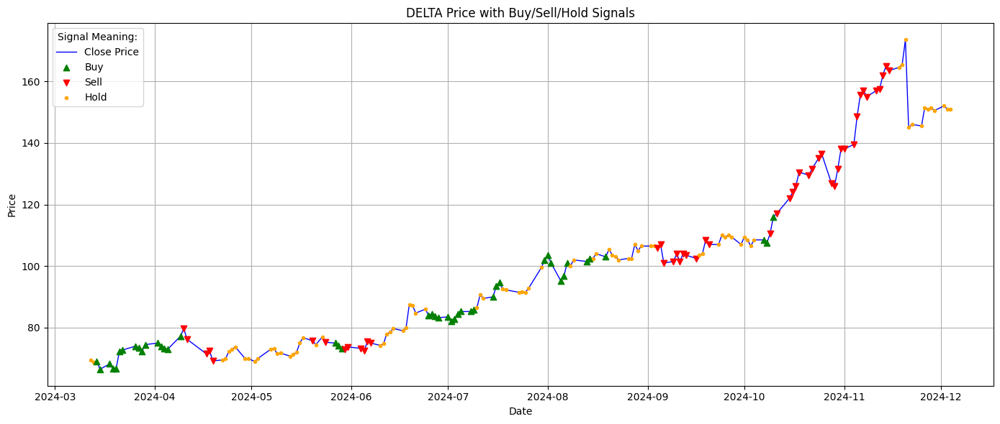

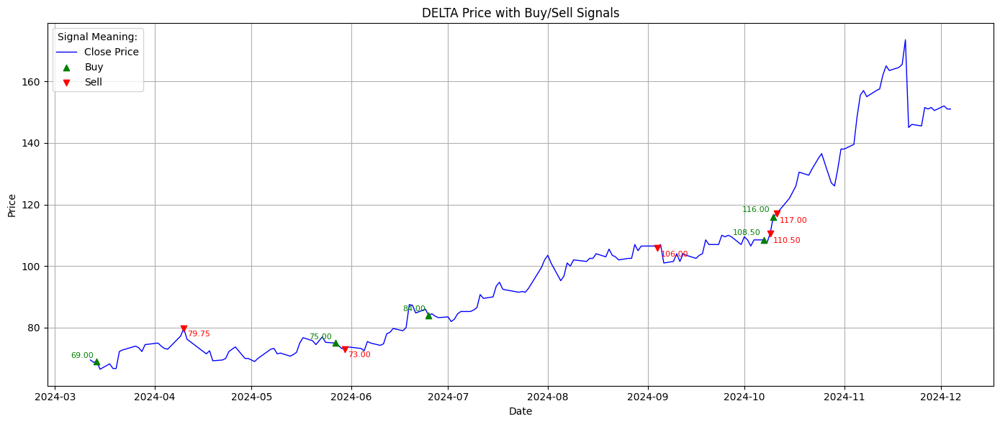

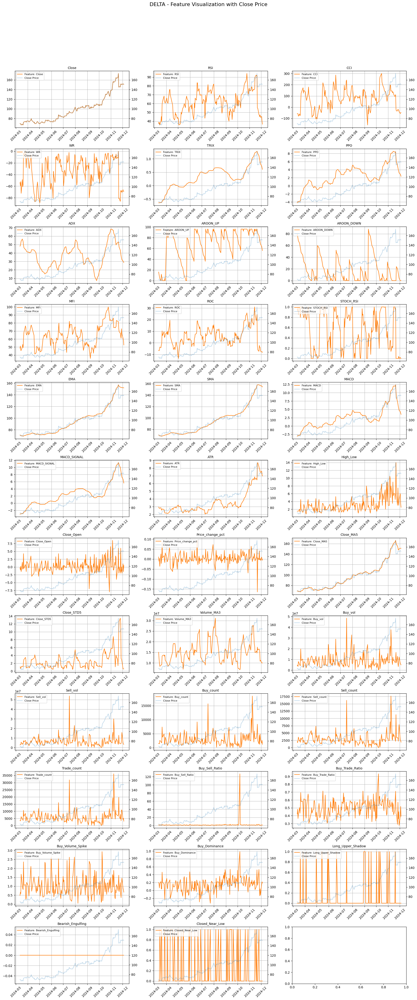

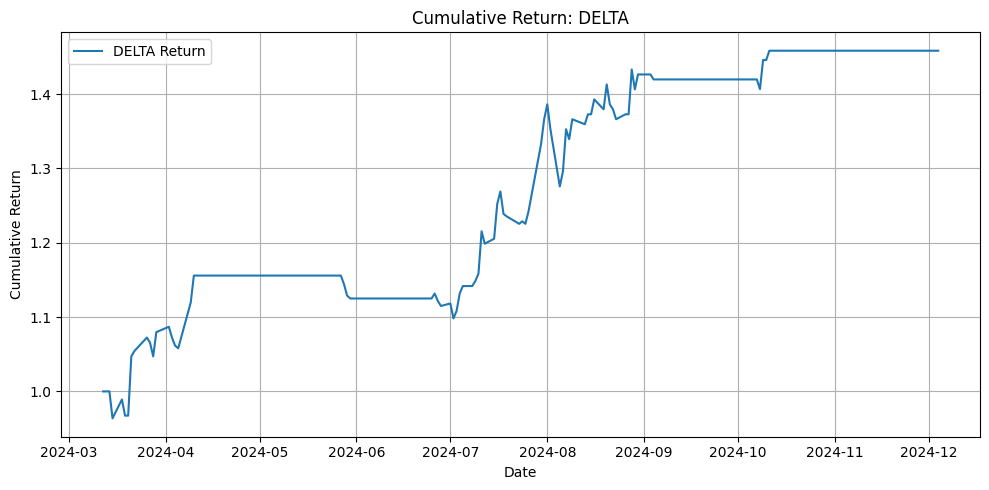


Class Counts for EGCO: {'Buy': 16, 'Hold': 107, 'Sell': 54}
Final Cumulative Return: 0.9971 (-0.29%)
Winning Days: 8 / 176
Losing Days: 9 / 176


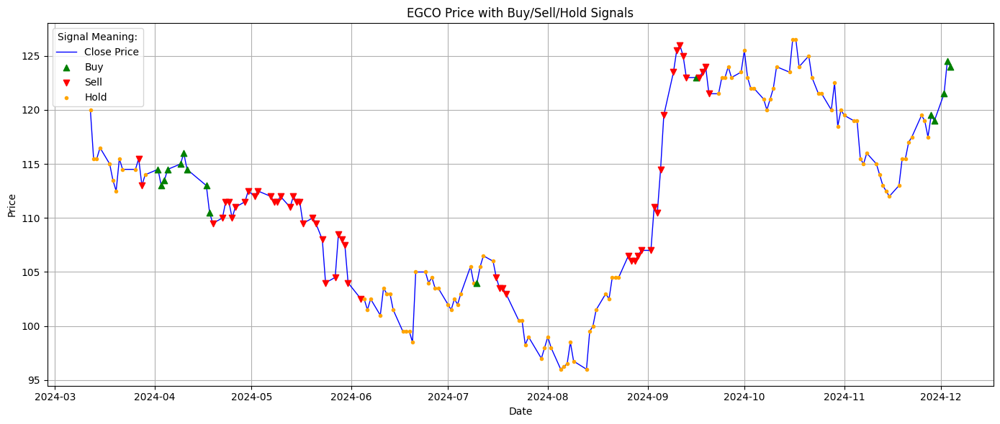

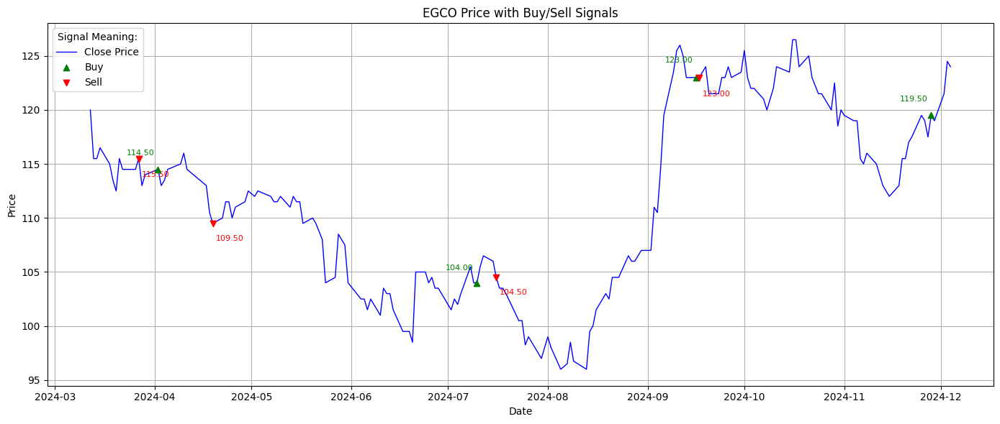

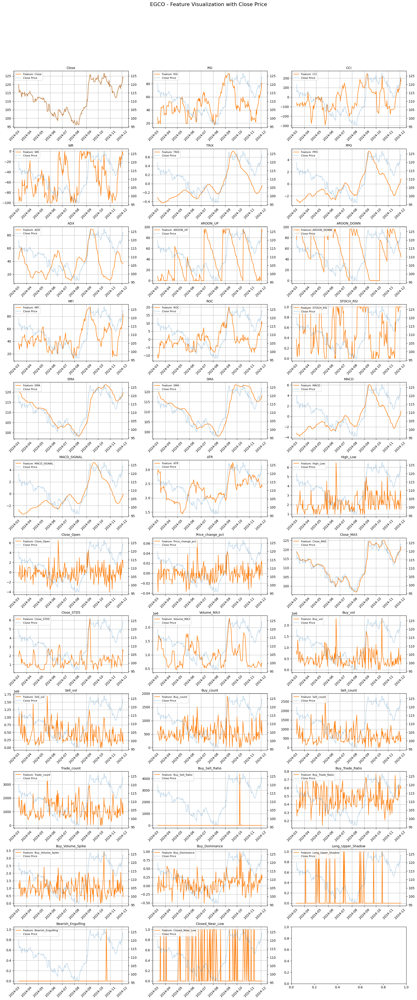

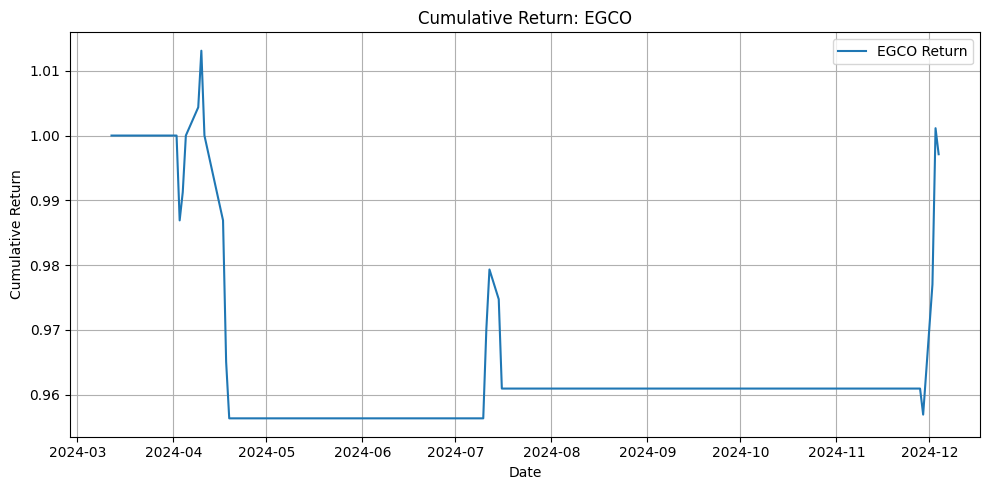


Class Counts for TOP: {'Buy': 32, 'Hold': 97, 'Sell': 48}
Final Cumulative Return: 0.8513 (-14.87%)
Winning Days: 35 / 176
Losing Days: 38 / 176


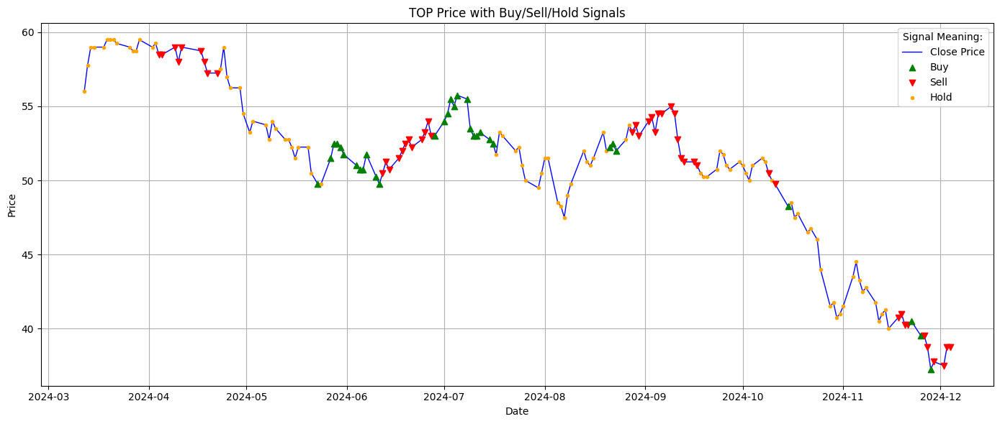

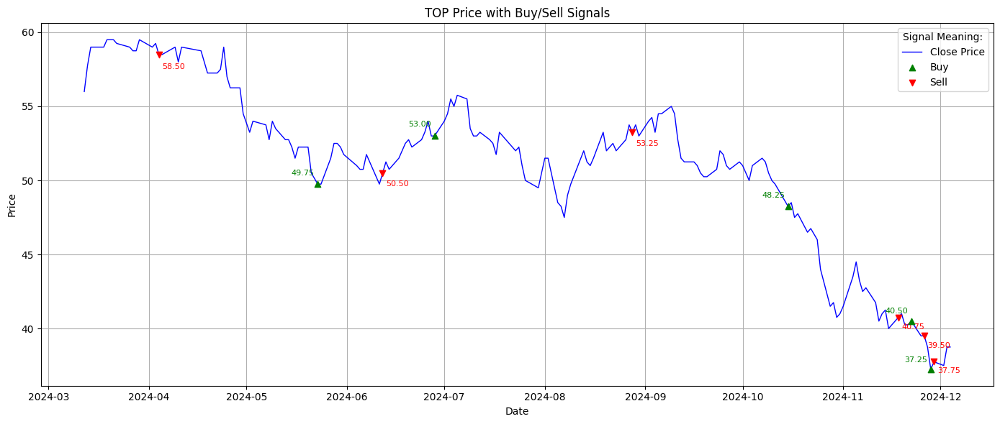

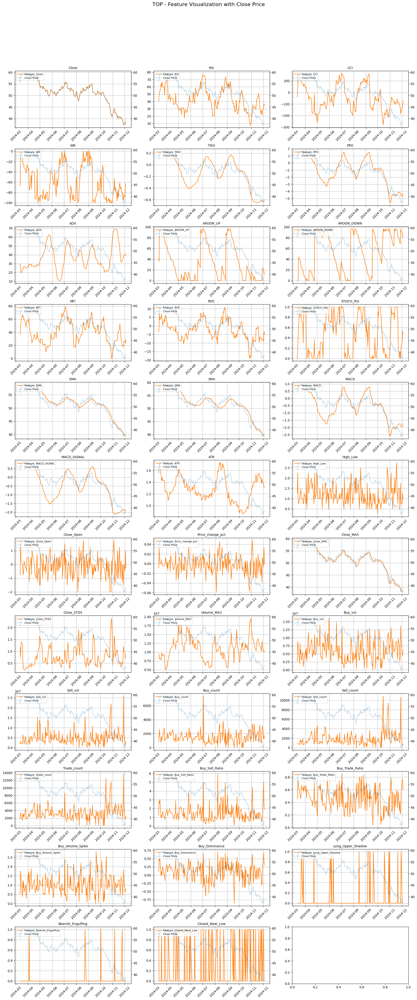

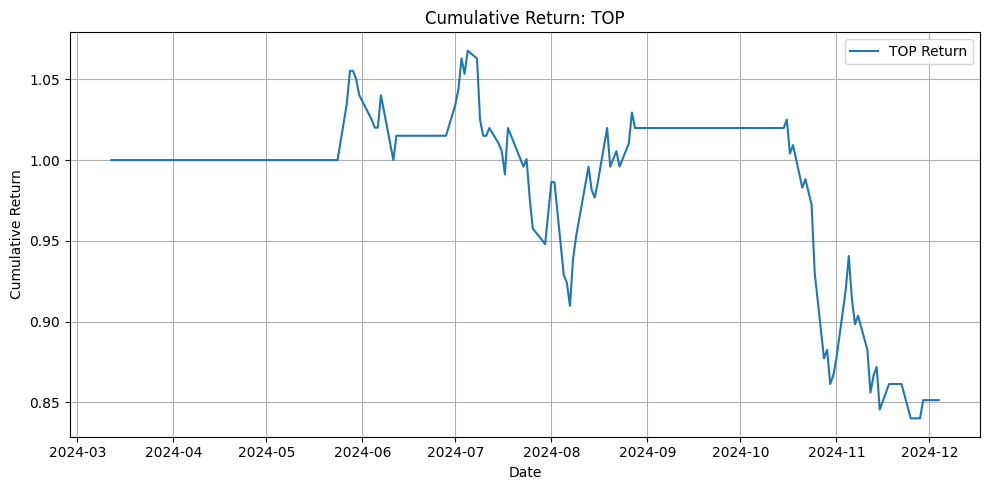


Class Counts for PTT: {'Buy': 54, 'Hold': 96, 'Sell': 27}
Final Cumulative Return: 0.9427 (-5.73%)
Winning Days: 41 / 176
Losing Days: 50 / 176


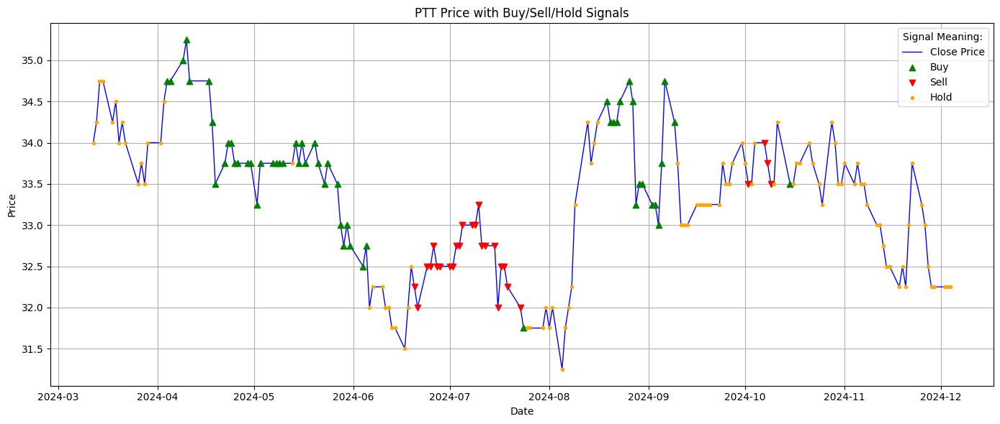

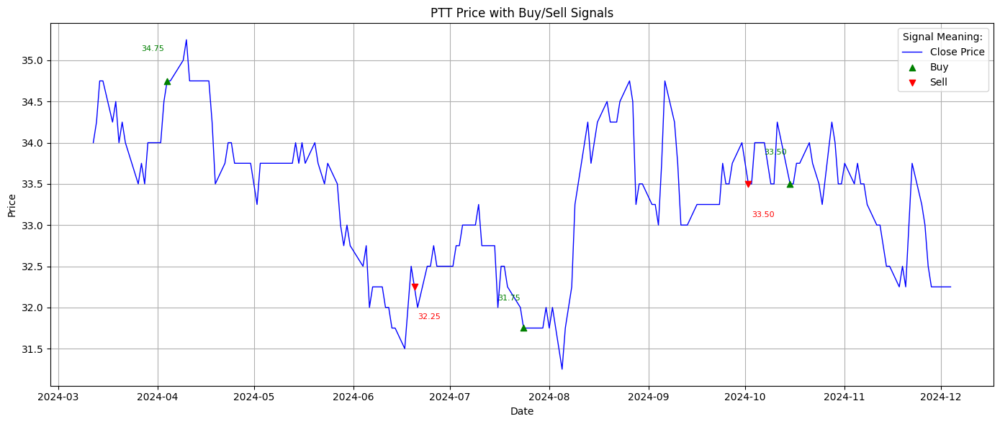

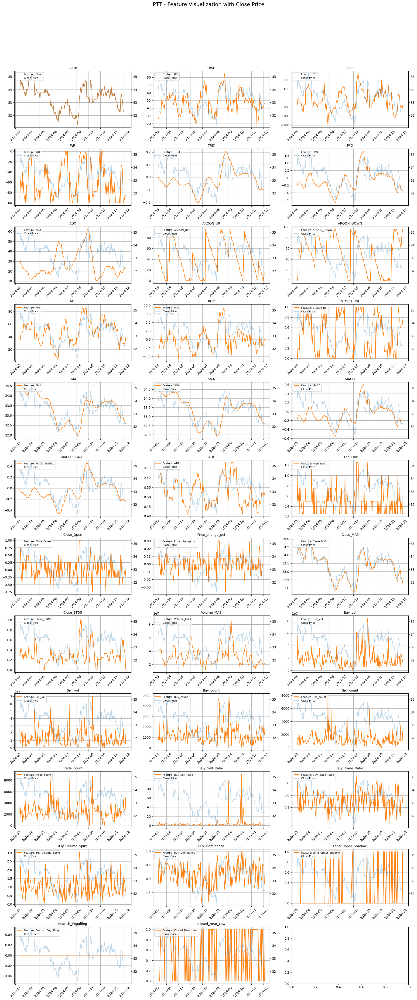

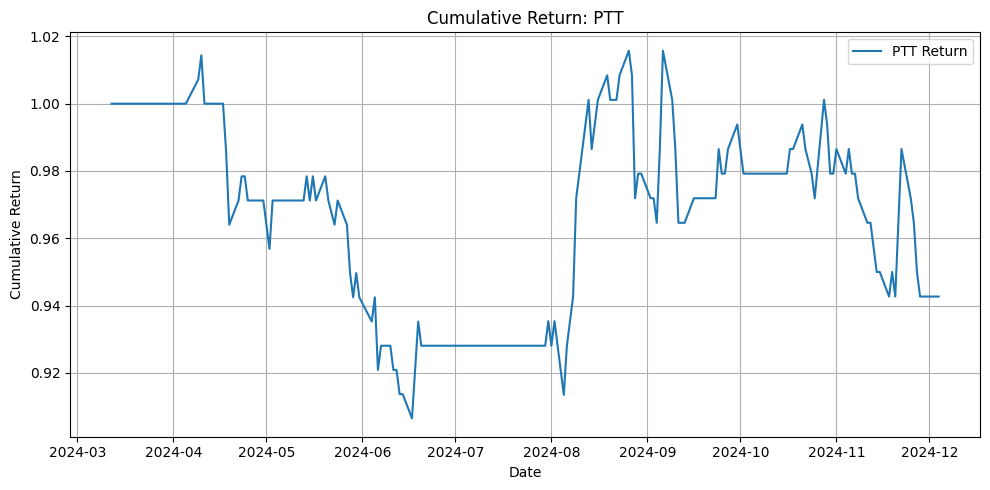


Class Counts for CPF: {'Buy': 11, 'Hold': 61, 'Sell': 105}
Final Cumulative Return: 1.0341 (3.41%)
Winning Days: 4 / 176
Losing Days: 4 / 176


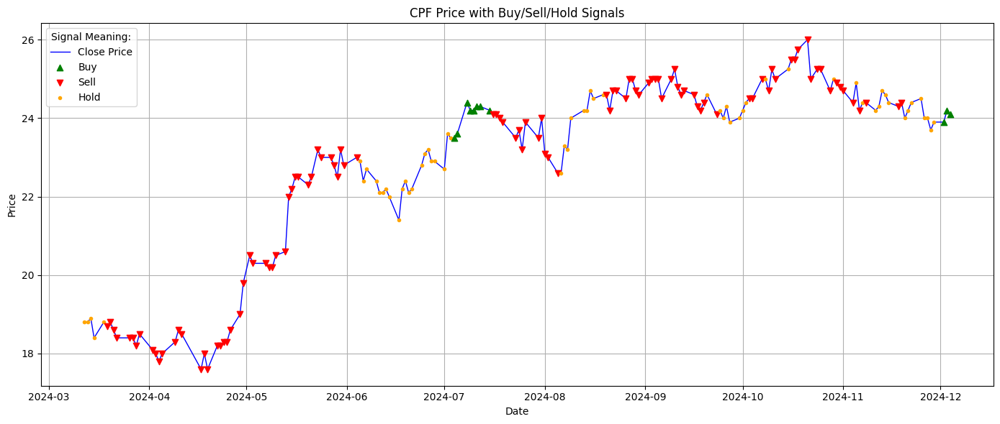

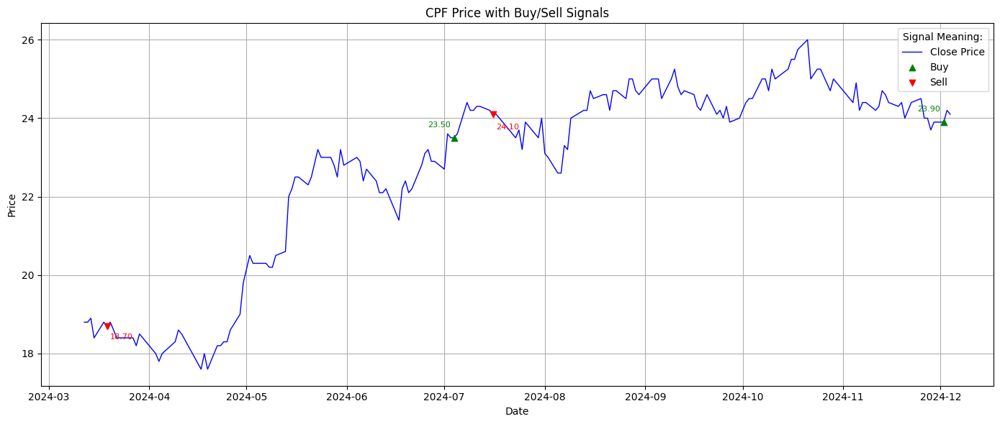

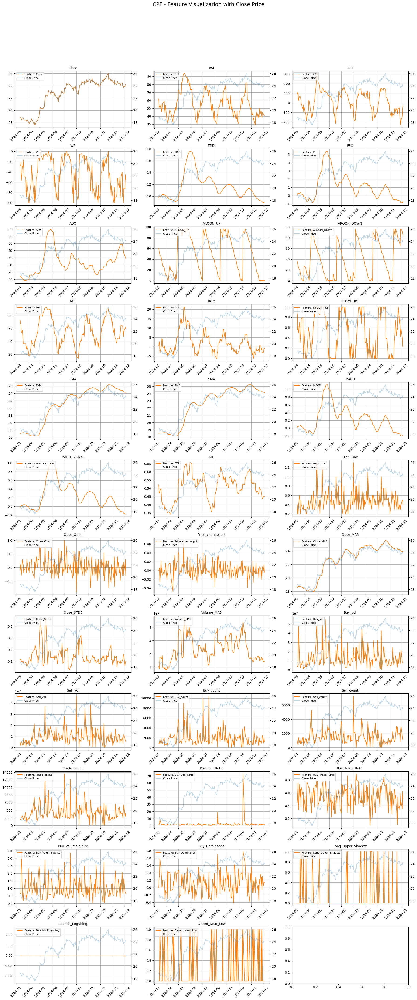

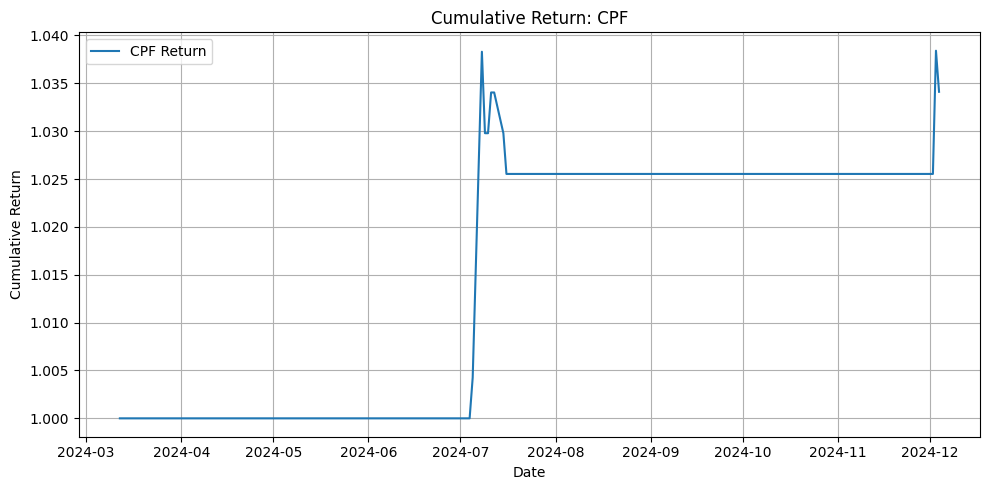

In [45]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import joblib
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import matplotlib.pyplot as plt
import pymysql
import sys
import os


# ===== เพิ่ม path ไปยัง transformer.ipynb ที่ convert เป็น .py แล้ว ===== #
sys.path.append("C:/ideatrade/model")
from transformer import TransformerSignalPredictor

# ===== DATABASE CONNECTION ===== #
def connect_database():
    return pymysql.connect(
        host="ideatrade.serveftp.net",
        port=51410,
        user="Kanokwan@Namfon",
        password="lTGnGcygfnRqU_ps",
        database="db_ideatrade"
    )

def get_stock_data(conn, start_date, end_date):
    query = """
    SELECT Symbol, Datetime, Open, High, Low, Close, Volume
    FROM stock_hloc
    WHERE Datetime BETWEEN %s AND %s
    ORDER BY Symbol, Datetime
    """
    df = pd.read_sql(query, conn, params=(start_date, end_date))
    df['Datetime'] = pd.to_datetime(df['Datetime'])
    return df

# ===== TECHNICAL INDICATORS (ย่อไว้) ===== #
def add_technical_indicators(df):
    def rsi(series, period=14):
        delta = series.diff()
        gain = delta.where(delta > 0, 0.0)
        loss = -delta.where(delta < 0, 0.0)
        avg_gain = gain.rolling(window=period).mean()
        avg_loss = loss.rolling(window=period).mean().replace(0, 0.0001)
        rs = avg_gain / avg_loss
        return 100 - (100 / (1 + rs))

    def cci(df, period=20):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        ma = tp.rolling(period).mean()
        md = tp.rolling(period).apply(lambda x: abs(x - x.mean()).mean(), raw=True).replace(0, 0.0001)
        return (tp - ma) / (0.015 * md)

    def williams_r(df, period=14):
        high = df['High'].rolling(period).max()
        low = df['Low'].rolling(period).min()
        denom = (high - low).replace(0, 0.0001)
        return -100 * (high - df['Close']) / denom

    def trix(series, period=15):
        ema1 = series.ewm(span=period).mean()
        ema2 = ema1.ewm(span=period).mean()
        ema3 = ema2.ewm(span=period).mean()
        return ema3.pct_change() * 100

    def ppo(series, fast=12, slow=26):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean().replace(0, 0.0001)
        return (ema_fast - ema_slow) / ema_slow * 100

    def adx(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        plus_dm = high.diff()
        minus_dm = low.diff()
        plus_dm[plus_dm < 0] = 0
        minus_dm[minus_dm > 0] = 0
        tr1 = high - low
        tr2 = abs(high - close.shift())
        tr3 = abs(low - close.shift())
        tr = pd.concat([tr1, tr2, tr3], axis=1).max(axis=1)
        atr = tr.rolling(period).mean()
        plus_di = 100 * (plus_dm.rolling(period).mean() / atr).replace(0, 0.0001)
        minus_di = abs(100 * (minus_dm.rolling(period).mean() / atr)).replace(0, 0.0001)
        dx = (abs(plus_di - minus_di) / (plus_di + minus_di)).replace(0, 0.0001) * 100
        return dx.rolling(period).mean()

    def aroon(df, period=25):
        aroon_up = df['High'].rolling(window=period).apply(lambda x: float(x.argmax()) / period * 100, raw=True)
        aroon_down = df['Low'].rolling(window=period).apply(lambda x: float(x.argmin()) / period * 100, raw=True)
        return aroon_up, aroon_down

    def mfi(df, period=14):
        tp = (df['High'] + df['Low'] + df['Close']) / 3
        mf = tp * df['Volume']
        pos_mf = mf.where(tp > tp.shift(), 0.0)
        neg_mf = mf.where(tp < tp.shift(), 0.0)
        pos_sum = pos_mf.rolling(period).sum()
        neg_sum = neg_mf.rolling(period).sum().replace(0, 0.0001)
        mfr = pos_sum / neg_sum
        return 100 - (100 / (1 + mfr))

    def roc(series, period=12):
        return series.pct_change(periods=period) * 100

    def stochastic_rsi(series, period=14):
        rsi_series = rsi(series, period)
        min_val = rsi_series.rolling(period).min()
        max_val = rsi_series.rolling(period).max()
        return (rsi_series - min_val) / (max_val - min_val + 1e-6)

    def ema(series, period=14):
        return series.ewm(span=period).mean()

    def sma(series, period=14):
        return series.rolling(window=period).mean()

    def macd(series, fast=12, slow=26, signal=9):
        ema_fast = series.ewm(span=fast).mean()
        ema_slow = series.ewm(span=slow).mean()
        macd_line = ema_fast - ema_slow
        signal_line = macd_line.ewm(span=signal).mean()
        return macd_line, signal_line

    def atr(df, period=14):
        high = df['High']
        low = df['Low']
        close = df['Close']
        tr = pd.concat([
            high - low,
            abs(high - close.shift()),
            abs(low - close.shift())
        ], axis=1).max(axis=1)
        return tr.rolling(period).mean()

    def bollinger_bands(series, period=20, num_std=2):
        sma = series.rolling(window=period).mean()
        std = series.rolling(window=period).std()
        upper_band = sma + (num_std * std)
        lower_band = sma - (num_std * std)
        return upper_band, lower_band



    # คำนวณ indicators สำหรับแต่ละ symbol แยกกัน
    result_df = pd.DataFrame()

    for symbol in df['Symbol'].unique():
        symbol_df = df[df['Symbol'] == symbol].copy()

        symbol_df['RSI'] = rsi(symbol_df['Close'])
        symbol_df['CCI'] = cci(symbol_df)
        symbol_df['WR'] = williams_r(symbol_df)
        symbol_df['TRIX'] = trix(symbol_df['Close'])
        symbol_df['PPO'] = ppo(symbol_df['Close'])
        symbol_df['ADX'] = adx(symbol_df)
        symbol_df['AROON_UP'], symbol_df['AROON_DOWN'] = aroon(symbol_df)
        symbol_df['MFI'] = mfi(symbol_df)
        symbol_df['ROC'] = roc(symbol_df['Close'])
        symbol_df['STOCH_RSI'] = stochastic_rsi(symbol_df['Close'])
        symbol_df['EMA'] = ema(symbol_df['Close'])
        symbol_df['SMA'] = sma(symbol_df['Close'])
        symbol_df['MACD'], symbol_df['MACD_SIGNAL'] = macd(symbol_df['Close'])
        symbol_df['ATR'] = atr(symbol_df)

        result_df = pd.concat([result_df, symbol_df])

    # ลบแถวที่มีค่า NaN และ reset index
    result_df = result_df.dropna().reset_index(drop=True)
    return result_df


# ===== SEQUENCE WINDOWING ===== #
def create_sequences(data, window_size=15):
    sequences = []
    for i in range(len(data) - window_size):
        sequences.append(data[i:i + window_size])
    return np.array(sequences)

# ===== BACKTEST STRATEGY ===== #
def backtest_strategy(prices, signals):
    position = 0  # 0 = no position, 1 = long
    daily_returns = []
    strategy_returns = []

    entry_points = []
    exit_points = []

    for i in range(1, len(prices)):
        signal = signals[i - 1]

        # Entry logic
        if signal == 'Buy' and position == 0:
            position = 1
            entry_points.append(i)

        # Exit logic
        elif signal == 'Sell' and position == 1:
            position = 0
            exit_points.append(i)

        daily_return = (prices[i] - prices[i - 1]) / prices[i - 1]
        strategy_return = position * daily_return
        daily_returns.append(strategy_return)
        strategy_returns.append(strategy_return)

    cumulative_returns = np.cumprod([1] + [r + 1 for r in strategy_returns])
    return daily_returns, cumulative_returns, entry_points, exit_points



# ===== LOAD MODEL ===== #
model_path = "C:\\ideatrade\\model\\transformer_model.pth"
label_encoder_path = "C:\ideatrade\model\label_encoder.pkl"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = TransformerSignalPredictor(input_dim=35, model_dim=128, num_heads=4, num_layers=2, num_classes=3)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()


label_encoder = joblib.load(label_encoder_path)


# ===== BACKTEST SELECTED SYMBOLS ===== #
selected_symbols = ['DELTA', 'EGCO', 'TOP', 'PTT', 'CPF']

conn = connect_database()
df_raw = get_stock_data(conn, '2023-12-31', '2024-12-31')
results = {}

df_symbol = df_raw[df_raw['Symbol'] == symbol].copy()

for symbol in selected_symbols:
    df_symbol = df_raw[df_raw['Symbol'] == symbol].copy()

    if df_symbol.empty:
        print(f"{symbol}: ไม่มีข้อมูลในช่วงเวลานี้")
        continue

    # เพิ่มคอลัมน์ Date และแปลงให้อยู่ใน datetime64[ns]
    df_symbol['Date'] = df_symbol['Datetime'].dt.normalize()
    df_tick_features['Date'] = pd.to_datetime(df_tick_features['Date'])

    # รวมข้อมูล tick features
    df_symbol = pd.merge(
        df_symbol,
        df_tick_features[df_tick_features['Symbol'] == symbol],
        how='left',
        on=['Symbol', 'Date']
    )

    # เติมค่า NaN ที่อาจเกิดขึ้นจากการ merge
    for col in ['Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count']:
        df_symbol[col] = df_symbol[col].fillna(0)
    df_symbol = add_technical_indicators(df_symbol)

    # เติม OHLCV-tickmatch features
    df_symbol['High_Low']         = df_symbol['High'] - df_symbol['Low']
    df_symbol['Close_Open']       = df_symbol['Close'] - df_symbol['Open']
    df_symbol['Price_change_pct'] = df_symbol['Close'].pct_change()
    df_symbol['Close_MA5']        = df_symbol['Close'].rolling(window=5).mean()
    df_symbol['Close_STD5']       = df_symbol['Close'].rolling(window=5).std()
    df_symbol['Volume_MA3']       = df_symbol['Volume'].rolling(window=5).mean()

    df_symbol['Buy_Sell_Ratio'] = df_symbol['Buy_vol'] / (df_symbol['Sell_vol'] + 1)
    df_symbol['Buy_Trade_Ratio'] = df_symbol['Buy_count'] / (df_symbol['Trade_count'] + 1)
    df_symbol['Buy_Volume_Spike'] = df_symbol['Buy_vol'] / (df_symbol['Buy_vol'].rolling(5).mean() + 1e-6)
    df_symbol['Buy_Dominance'] = (df_symbol['Buy_vol'] - df_symbol['Sell_vol']) / (df_symbol['Buy_vol'] + df_symbol['Sell_vol'] + 1)

    # 1. Upper shadow
    df_symbol["Upper_Shadow"] = df_symbol["High"] - df_symbol[["Open", "Close"]].max(axis=1)
    df_symbol["Long_Upper_Shadow"] = (df_symbol["Upper_Shadow"] > (df_symbol["High"] - df_symbol["Low"]) * 0.6).astype(int)

    # 2. Bearish engulfing
    df_symbol["Prev_Close"] = df_symbol["Close"].shift(1)
    df_symbol["Prev_Open"] = df_symbol["Open"].shift(1)
    df_symbol["Bearish_Engulfing"] = (
        (df_symbol["Prev_Close"] > df_symbol["Prev_Open"]) &
        (df_symbol["Open"] > df_symbol["Close"]) &
        (df_symbol["Open"] > df_symbol["Prev_Close"]) &
        (df_symbol["Close"] < df_symbol["Prev_Open"])
    ).astype(int)

    # 3. Close near low
    df_symbol["Close_to_Low_Pct"] = (df_symbol["Close"] - df_symbol["Low"]) / (df_symbol["High"] - df_symbol["Low"] + 1e-6)
    df_symbol["Closed_Near_Low"] = (df_symbol["Close_to_Low_Pct"] < 0.2).astype(int)



    # ลบ NaN ที่เกิดจากการ shift/rolling
    df_symbol = df_symbol.dropna().reset_index(drop=True)

    feature_cols = [
    'Close', 'RSI', 'CCI', 'WR', 'TRIX', 'PPO', 'ADX', 
    'AROON_UP', 'AROON_DOWN', 'MFI', 'ROC', 'STOCH_RSI', 
    'EMA', 'SMA', 'MACD', 'MACD_SIGNAL', 'ATR',
    'High_Low','Close_Open', 'Price_change_pct',
    'Close_MA5', 'Close_STD5', 'Volume_MA3','Buy_vol', 'Sell_vol', 'Buy_count', 'Sell_count', 'Trade_count',
    'Buy_Sell_Ratio', 'Buy_Trade_Ratio', 'Buy_Volume_Spike', 'Buy_Dominance',
    "Long_Upper_Shadow", "Bearish_Engulfing", 
    "Closed_Near_Low"
]

    if df_symbol[feature_cols].isnull().any().any() or len(df_symbol) < 30:
        print(f"{symbol} ข้อมูลไม่พอหรือมี NaN")
        continue

    features = df_symbol[feature_cols].values
    scaler = MinMaxScaler()
    features_scaled = scaler.fit_transform(features)

    sequences = create_sequences(features_scaled, window_size=15)
    prices = df_symbol['Close'].values[15:]
    datetimes = df_symbol['Datetime'].values[15:]

    if len(sequences) != len(prices):
        print(f"{symbol}: ความยาว sequence ไม่ตรงกับราคาหลัง window")
        continue

    with torch.no_grad():
        inputs = torch.tensor(sequences, dtype=torch.float32).to(device)
        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()

    decoded = label_encoder.inverse_transform(preds)

    # ===== Count Preds for Each Class ===== #
    class_counts = {
        'Buy': (decoded == 'Buy').sum(),
        'Hold': (decoded == 'Hold').sum(),
        'Sell': (decoded == 'Sell').sum()
    }
    print(f"\nClass Counts for {symbol}: {class_counts}")

    if len(set(decoded)) < 2:
        print(f"{symbol}: คำทำนายมีคลาสเดียว")
        continue

    # ===== Backtest ===== #
    daily_returns, cum_returns, entry_points, exit_points = backtest_strategy(prices, decoded)
    results[symbol] = cum_returns

    total_return = cum_returns[-1]
    percent_return = (total_return - 1) * 100
    avg_daily_return = np.mean(daily_returns) * 100
    std_daily_return = np.std(daily_returns) * 100
    winning_days = (np.array(daily_returns) > 0).sum()
    losing_days = (np.array(daily_returns) < 0).sum()

    print(f"Final Cumulative Return: {total_return:.4f} ({percent_return:.2f}%)")
    print(f"Winning Days: {winning_days} / {len(daily_returns)}")
    print(f"Losing Days: {losing_days} / {len(daily_returns)}")

    # ===== Plot Signal on Price Chart ===== #
    plt.figure(figsize=(14, 6))
    plt.plot(datetimes, prices, label='Close Price', color='blue', linewidth=1)

    # วาดสัญญาณ Buy/Sell/Hold แต่ไม่ใส่ label เพื่อไม่ให้ legend ซ้ำ
    for i, signal in enumerate(decoded):
        if signal == 'Buy':
            plt.scatter(datetimes[i], prices[i], marker='^', color='green', zorder=5)
        elif signal == 'Sell':
            plt.scatter(datetimes[i], prices[i], marker='v', color='red', zorder=5)
        elif signal == 'Hold':
            plt.scatter(datetimes[i], prices[i], marker='.', color='orange', zorder=5)

    # สร้าง dummy points เพื่อใช้ใน legend อย่างละอัน
    plt.scatter([], [], marker='^', color='green', label='Buy')
    plt.scatter([], [], marker='v', color='red', label='Sell')
    plt.scatter([], [], marker='.', color='orange', label='Hold')

    plt.title(f'{symbol} Price with Buy/Sell/Hold Signals')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(title='Signal Meaning:')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ===== Plot Signal on Price Chart ===== #
    import matplotlib.dates as mdates

    plt.figure(figsize=(14, 6))
    plt.plot(datetimes, prices, label='Close Price', color='blue', linewidth=1)

    last_signal = None  # ใช้เก็บสัญญาณก่อนหน้า

    for i, signal in enumerate(decoded):
        if signal == 'Buy' and last_signal != 'Buy':
            plt.scatter(datetimes[i], prices[i], marker='^', color='green', zorder=5)
            # เลื่อนข้อความไปทางซ้ายประมาณ 2 วัน (2 หน่วย datetime)
            plt.text(mdates.date2num(datetimes[i]) - 1, prices[i] + (prices[i] * 0.01),  
                    f'{prices[i]:.2f}', color='green', fontsize=8, ha='right', va='bottom')
            last_signal = 'Buy'
        elif signal == 'Sell' and last_signal != 'Sell':
            plt.scatter(datetimes[i], prices[i], marker='v', color='red', zorder=5)
            # เลื่อนข้อความไปทางขวาประมาณ 2 วัน
            plt.text(mdates.date2num(datetimes[i]) + 1, prices[i] - (prices[i] * 0.01),  
                    f'{prices[i]:.2f}', color='red', fontsize=8, ha='left', va='top')
            last_signal = 'Sell'

    # สร้าง dummy points เพื่อใช้ใน legend
    plt.scatter([], [], marker='^', color='green', label='Buy')
    plt.scatter([], [], marker='v', color='red', label='Sell')

    plt.title(f'{symbol} Price with Buy/Sell Signals')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(title='Signal Meaning:')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

     # ===== Plot All Features ===== #
    fig, axes = plt.subplots(nrows=len(feature_cols)//3 + 1, ncols=3, figsize=(18, len(feature_cols)*1.2))
    axes = axes.flatten()

    for idx, col in enumerate(feature_cols):
        # Plot feature (สีส้ม)
        axes[idx].plot(df_symbol['Datetime'].values[15:], df_symbol[col].values[15:], label=f'Feature: {col}', color='tab:orange')

        # Plot Close price (สีน้ำเงิน)
        ax2 = axes[idx].twinx()
        ax2.plot(df_symbol['Datetime'].values[15:], df_symbol['Close'].values[15:], label='Close Price', color='tab:blue', alpha=0.3)

        # ตกแต่งกราฟ
        axes[idx].set_title(col, fontsize=10)
        axes[idx].tick_params(axis='x', labelrotation=45)
        axes[idx].grid(True)

        # รวม legend ของทั้งสองแกน
        lines, labels = axes[idx].get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        axes[idx].legend(lines + lines2, labels + labels2, fontsize=8, loc='upper left')

    plt.tight_layout()
    plt.suptitle(f'{symbol} - Feature Visualization with Close Price', fontsize=16, y=1.02)
    plt.subplots_adjust(top=0.95)
    plt.show()


    # ===== SHOW RESULT ===== #
    plt.figure(figsize=(10, 5))
    plt.plot(datetimes, cum_returns, label=f'{symbol} Return')
    plt.title(f'Cumulative Return: {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

conn.close()

